In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from mpl_toolkits.basemap import Basemap
from scipy import stats
from scipy import interpolate
import matplotlib.cm as cm
import numpy.polynomial.polynomial as poly 
from ipywidgets import widgets
from IPython.display import display
%matplotlib inline
%matplotlib notebook

In [2]:
def errorfill(x, y ,yerr,color=None, fmt = None, label = None, alpha_fill=0.3, ax=None):
    '''Function to create error bands rather than error bars on a scatter plot
    Input:
    x : an array of floats
    y: an array of floats
    yerr: array of flotas as the errors of the y values
    Output:
    Plot of values with error bands'''
    ax = ax if ax is not None else plt.gca()
    if color is None:
        color = ax._get_lines.color_cycle.next()
    if np.isscalar(yerr) or len(yerr) == len(y):
        ymin = y - yerr
        ymax = y + yerr
    elif len(yerr) == 2:
        ymin, ymax = yerr
    ax.scatter(x, y, color=color, label=label)
    ax.plot(x, y, color=color)
    ax.fill_between(x, ymax, ymin, color=color, alpha=alpha_fill)

In [3]:
def MYConcatenate(Years, MY, FileFormat):
    '''Function to create a single data frame from separate data files, 
    specifically for the files containing the albedo data from mcs
    Input:
    Years: The earth year for the specific data file
    MY: The martian year gor the data obtained.
    FileFormat: The Julian date assigned to the file.
    '''
    Gen_File = '../WORK/MCS_ALBEDO_DATASETS/MY{}/A6_{}_{}_albedo.txt'
    MY_List=[]
    for Year in Years:
        df = pd.read_csv(Gen_File.format(MY, Year, FileFormat), 
        header=None, delimiter=r"\s+", names = ['L_s', 'Distance to Sun', 'Longitude',
        'Latitude','Solar zenith angle', 'Emission angle','Radiance', 'Albedo'])
        df['Mars Year'] = MY
        MY_List.append(df)
    return pd.concat(MY_List)

In [4]:
def CreateSubFrame(MarsYearDF, RanL_s, RanAlbedo, RanSZA, RanLat=[-90,90], RanLong=[-180,180]):
    '''Function to divide previously created data frames in smaller data frames by providing ranges
    Input:
    MarsYearDF: Mars Data frames 
    RanL_s: range of Solar Longitude example [0,360]
    RanAlbedo: Albedo Range example [0.5,1.0]
    RanSZA Solar Zenith angle range example [0,45]
    RanLat and RanLong are set as default
    Output: Several Subframes'''
    L_s_MYDF = MarsYearDF['L_s']
    Lat_MYDF = MarsYearDF['Latitude']
    Long_MYDF= MarsYearDF['Longitude']
    Alb_MYDF = MarsYearDF['Albedo']
    SolZen_MYDF = MarsYearDF['Solar zenith angle']
    MY_SUB = MarsYearDF[(L_s_MYDF <= RanL_s[1])  & (L_s_MYDF >= RanL_s[0]) & 
                        (Alb_MYDF <= RanAlbedo[1]) & (Alb_MYDF >= RanAlbedo[0]) & 
                        (SolZen_MYDF <= RanSZA[1]) & (SolZen_MYDF >= RanSZA[0]) &
                        (Lat_MYDF <= RanLat[1] ) & (Lat_MYDF >= RanLat[0]) & 
                        (Long_MYDF <= RanLong[1]) & (Long_MYDF >= RanLong[0])]
    return MY_SUB

In [5]:
def SubDict(MarsYearDF, TotRanL_s=[0,360], L_sStep=5.0, RanAlbedo=[0.0,1.0], RanSZA=[0.0,70.0], RanLat=[-90,90], RanLong=[-180,180]):
    '''Function to create a dictionary of subframes utilizing the CreateSubFrame function, this function will run through
    the dataframes in Solar Longitude step sizes (default is 5 but can be changed) and make the divisions
    Input:
    MarsYearDF: Mars Data frames 
    MY: Martian Year String
    TotRanL_s: range of values for solar longitude
    L_sStep: Step size
    RanL_s: range of Solar Longitude example [0,360]
    RanAlbedo: Albedo Range example [0.5,1.0]
    RanSZA Solar Zenith angle range example [0,45]
    RanLat and RanLong are set as default
    Output: Dictionary of Sub frames'''
    if (TotRanL_s[1]-TotRanL_s[0])%L_sStep != 0:
        raise('Bad Step Size')
    AllSubs = {}
    SubStr = 'MY_SUB{}'
    for i,L_sBound in enumerate(np.arange(TotRanL_s[0], TotRanL_s[1], L_sStep)):
        NewSub = CreateSubFrame(MarsYearDF, [L_sBound, L_sBound + L_sStep], RanAlbedo, RanSZA, RanLat, RanLong)
        AllSubs[SubStr.format(i)] = NewSub
    return AllSubs   

In [6]:
def SubStats(MYDict):
    '''Function to run statistics on data on the subframes from the dictionaries created by the SubDict function
    Input:
    MYDict: Dictionary Created by the SubDict Function
    Output:
    SubAvg: Average of the Albedo for each subframe in the dictionary
    SubStd: Standard Deviation of the Albedo for each subframe in the dictionary
    Sub_L_s: Average of the  Solar Longitude range for each subframe in the dictionary'''
    SubframeNum = len(MYDict.keys())
    SubAvg = []
    SubStd = []
    Sub_L_s = []
    SubSZAvg = []
    SubStr = 'MY_SUB{}'
    for i in range(SubframeNum):
        Subframe = MYDict[SubStr.format(i)]
        SubAvg.append(np.mean(Subframe['Albedo']))
        SubStd.append(np.std(Subframe['Albedo']))
        Sub_L_s.append(np.mean(Subframe['L_s']))
        SubSZAvg.append(np.mean(Subframe['Solar zenith angle']))
    SubAvg = np.array(SubAvg)
    SubStd = np.array(SubStd)
    Sub_L_s = np.array(Sub_L_s)
    SubSZAvg =np.array(SubSZAvg)
    return SubAvg, SubStd, Sub_L_s, SubSZAvg

In [7]:
def DataAlb(MYDict):
    '''Function to store data for latitude, longitude, albedo and solar zenith angle into listts to be used to graph.
    Input:
    MYDict: Dictionary Created by the SubDict Function
    Output:
    SubLat: Latitude array from sub frames
    SubLong: Longitude array from sub frames
    SubAlb: Albedo array from sub frames
    SunSZA: Solar Zenith Angle array from sub frames'''
    SubframeNum = len(MYDict.keys())
    SubLat = []
    SubLong = []
    SubAlb = []
    SubSZA = []
    SubStr = 'MY_SUB{}'
    for i in range(SubframeNum):
        Subframe = MYDict[SubStr.format(i)]
        SubLat.append(Subframe['Latitude'])
        SubLong.append(Subframe['Longitude'])
        SubAlb.append(Subframe['Albedo'])
        SubSZA.append(Subframe['Solar zenith angle'])
    SubLat = np.array(SubLat)
    SubLong = np.array(SubLong)
    SubAlb = np.array(SubAlb)
    SubSZA = np.array(SubSZA)
    return SubLat, SubLong, SubAlb, SubSZA

In [8]:
def polyval_NaN(p,data):
    '''Function to do a numpy polyval operation on arrays with NaN values 
    Input:
    p = polynomial length based on polyfit
    data = array of data sets that includes NaN values
    Output
    data2: the array with a polyval operation done to it'''
    data2 = np.full_like(data, np.nan)
    good = ~np.isnan(data)
    data2[good] = np.polyval(p,data[good])
    return data2

In [9]:
########
# pco2 #
########
# --------------------------------------------
# Equilibrium vapor pressure over solid CO2
# Brown and Ziegler (1980)
# --------------------------------------------
# Input:
#    T = temperature of solid [K]
# Output:
#    vapor pressure [Pa]
def pco2(T):
    A0 = 2.13807649e1
    A1 = -2.57064700e3
    A2 = -7.78129489e4
    A3 = 4.32506256e6
    A4 = -1.20671368e8
    A5 = 1.34966306e9
    # Pressure in torr
    ptorr = np.exp(A0 + (A1/(T)) + (A2/(T**2)) + (A3/(T**3)) + (A4/(T**4)) + (A5/(T**5)))
    # Pressure in Pa
    p = ptorr*133.3223684211
    return p

In [10]:
########
# tco2 #
########
#-------------------------------------------------------------------------
#Calculate (approximately) the condensation temperature of CO2 at the
#specified pressure(s) (Pa), using the empirical law from Brown and 
#Ziegler (1980). This function calls the pco2() routine.
#-------------------------------------------------------------------------
# Input:
#    p = vapor pressure [Pa]
# Output:
#    temperature of solid [K]
def tco2(p):
    Trange = np.arange(30,350)
    T = interpolate.pchip_interpolate(pco2(Trange),Trange,p)
    return T

In [11]:
# Function: ls2sol
# Purpose: convert Mars "Lsubs" to sol (day of year)
# Input: 
#    ls = areocentric longitude of the Sun [array]
#    n = degree of polynomial fit [scalar]
def ls2sol(ls, n):
    # data
    lsdata = (0,30,60,90,120,150,180,210,240,270,300,330,360) # L_s array
    soldata = (0,61.2,126.6,193.3,257.8,317.5,371.9,421.6,468.5,514.6,562.0,612.9,668.6) # Sol array
    
    # polynomial fit
    p = np.polyfit(lsdata, soldata, n)
    
    # sol for Ls input
    sol = np.polyval(p, ls)
    
    # return result
    return sol

In [12]:
def MYretrieval(dataframe, MY):
    if MY == '28':
        return dataframe[(dataframe['MY'] == 28)]
    elif MY == '29':
        return dataframe[(dataframe['MY'] == 29)]
    elif MY == '30':
        return dataframe[(dataframe['MY'] == 30)]
    elif MY == '31':
        return dataframe[(dataframe['MY'] == 31)]
    elif MY == '32':
        return dataframe[(dataframe['MY'] == 32)]
    elif MY == '33':
        return dataframe[(dataframe['MY'] == 33)]
    elif MY == '34':
        return dataframe[(dataframe['MY'] == 34)]
    elif MY == '35':
        return dataframe[(dataframe['MY'] == 35)]

In [13]:
def CreateEmiFrame(MarsDF, RanL_s, RanLat):
    '''Function to divide previously created data frames in smaller data frames by providing ranges
    Input:
    MarsYearDF: Mars Data frames 
    RanL_s: range of Solar Longitude example [0,360]
    RanAlbedo: Albedo Range example [0.5,1.0]
    RanSZA Solar Zenith angle range example [0,45]
    RanLat and RanLong are set as default
    Output: Several Subframes'''
    L_s_MYDF = MarsDF['L_s']
    Lat_MYDF = MarsDF['Surf_lat']
    Long_MYDF = MarsDF['Surf_lon']
    MY_SUB = MarsDF[(L_s_MYDF <= RanL_s[-1])  & (L_s_MYDF >= RanL_s[0]) &
                        (Lat_MYDF <= RanLat[-1] ) & (Lat_MYDF >= RanLat[0])]
    return MY_SUB

In [14]:
def SubEmiDict(MarsYearDF, TotRanL_s=[0,360], L_sStep=15.0, RanLat=[-90,90]):
    '''Function to create a dictionary of subframes utilizing the CreateSubFrame function, this function will run through
    the dataframes in Solar Longitude step sizes (default is 5 but can be changed) and make the divisions
    Input:
    MarsYearDF: Mars Data frames 
    MY: Martian Year String
    TotRanL_s: range of values for solar longitude
    L_sStep: Step size
    RanL_s: range of Solar Longitude example [0,360]
    RanAlbedo: Albedo Range example [0.5,1.0]
    RanSZA Solar Zenith angle range example [0,45]
    RanLat and RanLong are set as default
    Output: Dictionary of Sub frames'''
    if (TotRanL_s[1]-TotRanL_s[0])%L_sStep != 0:
        raise('Bad Step Size')
    AllSubs = {}
    SubStr = 'MY_SUB{}'
    for i,L_sBound in enumerate(np.arange(TotRanL_s[0], TotRanL_s[1], L_sStep)):
        NewSub = CreateEmiFrame(MarsYearDF, [L_sBound, L_sBound + L_sStep], RanLat)
        AllSubs[SubStr.format(i)] = NewSub
    return AllSubs 

In [15]:
def IRFlux(T):
    '''Calculate the luminosity of the thing.'''
    sigma = 5.67e-8 # W/m**2/K**4
    boltz = sigma * T**4
    return boltz

In [16]:
def DataEmi(MYDict):
    '''Function to store data for latitude, longitude, albedo and solar zenith angle into listts to be used to graph.
    Input:
    MYDict: Dictionary Created by the SubDict Function
    Output:
    SubLat: Latitude array from sub frames
    SubLong: Longitude array from sub frames
    SubAlb: Albedo array from sub frames
    SunSZA: Solar Zenith Angle array from sub frames'''
    SubframeNum = len(MYDict.keys())
    SubLat = []
    SubLong = []
    SubTemp = []
    SubPres = []
    SubIR = []
    SubFPT = []
    SubStr = 'MY_SUB{}'
    for i in range(SubframeNum):
        Subframe = MYDict[SubStr.format(i)]
        SubLat.append(Subframe['Surf_lat'])
        SubLong.append(Subframe['Surf_lon'])
        SubTemp.append(Subframe['T_surf'])
        SubPres.append(Subframe['p_surf'])
        SubIR.append(IRFlux(Subframe['T_surf']))
        SubFPT.append(Subframe['Frost_T'])
    SubLat = np.array(SubLat)
    SubLong = np.array(SubLong)
    SubTemp = np.array(SubTemp)
    SubPres = np.array(SubPres)
    SubIR = np.array(SubIR)
    return SubLat, SubLong, SubTemp, SubPres, SubIR, SubFPT

In [17]:
YearsMY29 = ['2007', '2008', '2009']
MY29 = MYConcatenate(YearsMY29, '29', 'JD2454444-2455131')

In [18]:
YearsMY30 = ['2009', '2010', '2011']
MY30 = MYConcatenate(YearsMY30, '30', 'JD2455131-2455818')

In [19]:
YearsMY31 = ['2011', '2012', '2013']
MY31 = MYConcatenate(YearsMY31, '31', 'JD2455818-2456505')

In [20]:
YearsMY32 = ['2013', '2014', '2015']
MY32 = MYConcatenate(YearsMY32, '32', 'JD2456505-2457192')

In [21]:
YearsMY33 = ['2015', '2016', '2017']
MY33 = MYConcatenate(YearsMY33, '33', 'JD2457192-2457879')

In [22]:
MY29_Subframes = SubDict(MY29, L_sStep = 15.0)

In [23]:
MY30_Subframes = SubDict(MY30, L_sStep = 15.0)

In [24]:
MY31_Subframes = SubDict(MY31, L_sStep = 15.0)

In [25]:
MY32_Subframes = SubDict(MY32, L_sStep = 15.0)

In [26]:
MY33_Subframes = SubDict(MY33, L_sStep = 15.0)

In [27]:
Alb29 = DataAlb(MY29_Subframes)
Alb30 = DataAlb(MY30_Subframes)
Alb31 = DataAlb(MY31_Subframes)
Alb32 = DataAlb(MY32_Subframes)
Alb33 = DataAlb(MY33_Subframes)

In [28]:
MY29N = MY29[(MY29['Solar zenith angle'] <= 60.0) & (MY29['Latitude'] >= 60.0) & (MY29['Latitude'] <= 90.0)]
MY29N = MY29N.drop(columns = ['L_s','Distance to Sun','Solar zenith angle','Emission angle','Radiance', 'Mars Year'])

In [29]:
MY29S = MY29[(MY29['Solar zenith angle'] <= 60.0) & (MY29['Latitude'] <= -60.0) & (MY29['Latitude'] >= -90.0)] 
MY29S = MY29S.drop(columns = ['L_s','Distance to Sun','Solar zenith angle','Emission angle','Radiance', 'Mars Year'])

In [30]:
MY30N = MY30[(MY30['Solar zenith angle'] <= 60.0) & (MY30['Latitude'] >= 60.0) & (MY30['Latitude'] <= 90.0)]
MY30N = MY30N.drop(columns = ['L_s','Distance to Sun','Solar zenith angle','Emission angle','Radiance', 'Mars Year'])

In [31]:
MY30S = MY30[(MY30['Solar zenith angle'] <= 60.0)& (MY30['Latitude'] >= -90.0) & (MY30['Latitude'] <= -60.0)]
MY30S = MY30S.drop(columns = ['L_s','Distance to Sun','Solar zenith angle','Emission angle','Radiance', 'Mars Year'])

In [32]:
MY31N = MY31[(MY31['Solar zenith angle'] <= 60.0)& (MY31['Latitude'] >= 60.0) & (MY31['Latitude'] <= 90.0)]
MY31N = MY31N.drop(columns = ['L_s','Distance to Sun','Solar zenith angle','Emission angle','Radiance', 'Mars Year'])

In [33]:
MY31S = MY31[(MY31['Solar zenith angle'] <= 60.0)& (MY31['Latitude'] >= -90.0) & (MY31['Latitude'] <= -60.0)]
MY31S = MY31S.drop(columns = ['L_s','Distance to Sun','Solar zenith angle','Emission angle','Radiance', 'Mars Year'])

In [34]:
MY33N = MY33[(MY33['Solar zenith angle'] <= 60.0)& (MY33['Latitude'] >= 60.0) & (MY33['Latitude'] <= 90.0)]
MY33N = MY33N.drop(columns = ['L_s','Distance to Sun','Solar zenith angle','Emission angle','Radiance', 'Mars Year'])

In [35]:
MY33S = MY33[(MY33['Solar zenith angle'] <= 60.0)& (MY33['Latitude'] >= -90.0) & (MY33['Latitude'] <= -60.0)]
MY33S = MY33S.drop(columns = ['L_s','Distance to Sun','Solar zenith angle','Emission angle','Radiance', 'Mars Year'])

In [36]:
NAlb = pd.concat([MY29N,MY30N,MY31N,MY33N])

In [37]:
SAlb = pd.concat([MY29S,MY30S,MY31S,MY33S])

# Plots for Martian Year 29, JD2454444-2455131 

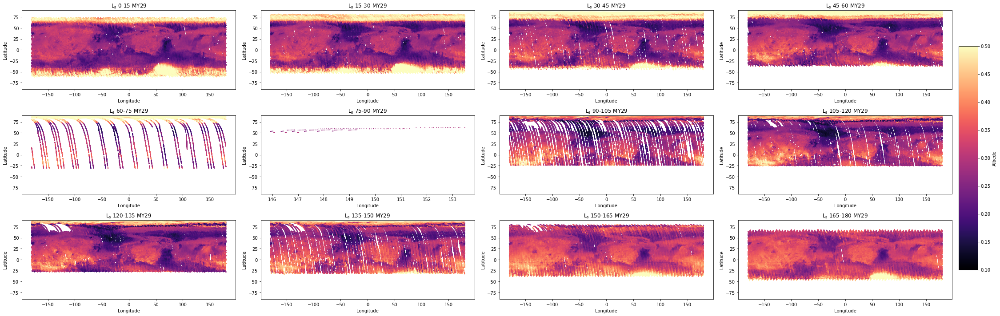

In [38]:
fig, axes = plt.subplots(3,4, sharex = False, sharey = False, figsize= (30,10))
plt.sca(axes[0,0])
plt.scatter(Alb29[1][0], Alb29[0][0],c=Alb29[2][0], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 0-15 MY29')
plt.ylim(-90.0,90.0)
plt.sca(axes[0,1])
plt.scatter(Alb29[1][1], Alb29[0][1],c=Alb29[2][1], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 15-30 MY29')
plt.ylim(-90.0,90.0)
plt.sca(axes[0,2])
plt.scatter(Alb29[1][2], Alb29[0][2],c=Alb29[2][2], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 30-45 MY29')
plt.ylim(-90.0,90.0)
plt.sca(axes[0,3])
plt.scatter(Alb29[1][3], Alb29[0][3],c=Alb29[2][3], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 45-60 MY29')
plt.ylim(-90.0,90.0)
plt.sca(axes[1,0])
plt.scatter(Alb29[1][4], Alb29[0][4],c=Alb29[2][4], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 60-75 MY29')
plt.ylim(-90.0,90.0)
plt.sca(axes[1,1])
plt.scatter(Alb29[1][5], Alb29[0][5],c=Alb29[2][5], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 75-90 MY29')
plt.ylim(-90.0,90.0)
plt.sca(axes[1,2])
plt.scatter(Alb29[1][6], Alb29[0][6],c=Alb29[2][6], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 90-105 MY29')
plt.ylim(-90.0,90.0)
plt.sca(axes[1,3])
plt.scatter(Alb29[1][7], Alb29[0][7],c=Alb29[2][7], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 105-120 MY29')
plt.ylim(-90.0,90.0)
plt.sca(axes[2,0])
plt.scatter(Alb29[1][8], Alb29[0][8],c=Alb29[2][8], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 120-135 MY29')
plt.ylim(-90.0,90.0)
plt.sca(axes[2,1])
plt.scatter(Alb29[1][9], Alb29[0][9],c=Alb29[2][9], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 135-150 MY29')
plt.ylim(-90.0,90.0)
plt.sca(axes[2,2])
plt.scatter(Alb29[1][10], Alb29[0][10],c=Alb29[2][10], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 150-165 MY29')
plt.ylim(-90.0,90.0)
plt.sca(axes[2,3])
plt.scatter(Alb29[1][11], Alb29[0][11],c=Alb29[2][11], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 165-180 MY29')
plt.ylim(-90.0,90.0)
plt.tight_layout()
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])
cbar = plt.colorbar(cax=cbar_ax)
cbar.set_label('Albedo')
plt.show()

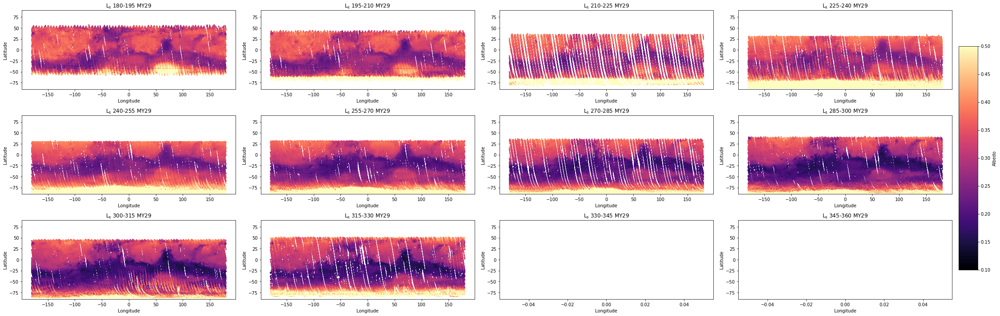

In [39]:
fig, axes = plt.subplots(3,4, sharex = False, sharey = False, figsize= (30,10))
plt.sca(axes[0,0])
plt.scatter(Alb29[1][12], Alb29[0][12],c=Alb29[2][12], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 180-195 MY29')
plt.ylim(-90.0,90.0)
plt.sca(axes[0,1])
plt.scatter(Alb29[1][13], Alb29[0][13],c=Alb29[2][13], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 195-210 MY29')
plt.ylim(-90.0,90.0)
plt.sca(axes[0,2])
plt.scatter(Alb29[1][14], Alb29[0][14],c=Alb29[2][14], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 210-225 MY29')
plt.ylim(-90.0,90.0)
plt.sca(axes[0,3])
plt.scatter(Alb29[1][15], Alb29[0][15],c=Alb29[2][15], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 225-240 MY29')
plt.ylim(-90.0,90.0)
plt.sca(axes[1,0])
plt.scatter(Alb29[1][16], Alb29[0][16],c=Alb29[2][16], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 240-255 MY29')
plt.ylim(-90.0,90.0)
plt.sca(axes[1,1])
plt.scatter(Alb29[1][17], Alb29[0][17],c=Alb29[2][17], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 255-270 MY29')
plt.ylim(-90.0,90.0)
plt.sca(axes[1,2])
plt.scatter(Alb29[1][18], Alb29[0][18],c=Alb29[2][18], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 270-285 MY29')
plt.ylim(-90.0,90.0)
plt.sca(axes[1,3])
plt.scatter(Alb29[1][19], Alb29[0][19],c=Alb29[2][19], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 285-300 MY29')
plt.ylim(-90.0,90.0)
plt.sca(axes[2,0])
plt.scatter(Alb29[1][20], Alb29[0][20],c=Alb29[2][20], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 300-315 MY29')
plt.ylim(-90.0,90.0)
plt.sca(axes[2,1])
plt.scatter(Alb29[1][21], Alb29[0][21],c=Alb29[2][21], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 315-330 MY29')
plt.ylim(-90.0,90.0)
plt.sca(axes[2,2])
plt.scatter(Alb29[1][22], Alb29[0][22],c=Alb29[2][22], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 330-345 MY29')
plt.ylim(-90.0,90.0)
plt.sca(axes[2,3])
plt.scatter(Alb29[1][23], Alb29[0][23],c=Alb29[2][23], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 345-360 MY29')
plt.ylim(-90.0,90.0)
plt.tight_layout()
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])
cbar = plt.colorbar(cax=cbar_ax)
cbar.set_label('Albedo')
plt.show()

# Plots for Martian Year 30, JD2455131-2455818

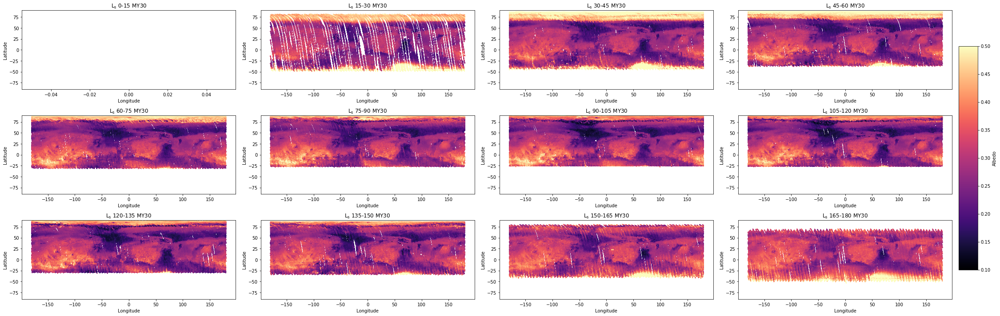

In [40]:
fig, axes = plt.subplots(3,4, sharex = False, sharey = False, figsize= (30,10))
plt.sca(axes[0,0])
plt.scatter(Alb30[1][0], Alb30[0][0],c=Alb30[2][0], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 0-15 MY30')
plt.ylim(-90.0,90.0)
plt.sca(axes[0,1])
plt.scatter(Alb30[1][1], Alb30[0][1],c=Alb30[2][1], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 15-30 MY30')
plt.ylim(-90.0,90.0)
plt.sca(axes[0,2])
plt.scatter(Alb30[1][2], Alb30[0][2],c=Alb30[2][2], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 30-45 MY30')
plt.ylim(-90.0,90.0)
plt.sca(axes[0,3])
plt.scatter(Alb30[1][3], Alb30[0][3],c=Alb30[2][3], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 45-60 MY30')
plt.ylim(-90.0,90.0)
plt.sca(axes[1,0])
plt.scatter(Alb30[1][4], Alb30[0][4],c=Alb30[2][4], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 60-75 MY30')
plt.ylim(-90.0,90.0)
plt.sca(axes[1,1])
plt.scatter(Alb30[1][5], Alb30[0][5],c=Alb30[2][5], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 75-90 MY30')
plt.ylim(-90.0,90.0)
plt.sca(axes[1,2])
plt.scatter(Alb30[1][6], Alb30[0][6],c=Alb30[2][6], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 90-105 MY30')
plt.ylim(-90.0,90.0)
plt.sca(axes[1,3])
plt.scatter(Alb30[1][7], Alb30[0][7],c=Alb30[2][7], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 105-120 MY30')
plt.ylim(-90.0,90.0)
plt.sca(axes[2,0])
plt.scatter(Alb30[1][8], Alb30[0][8],c=Alb30[2][8], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 120-135 MY30')
plt.ylim(-90.0,90.0)
plt.sca(axes[2,1])
plt.scatter(Alb30[1][9], Alb30[0][9],c=Alb30[2][9], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 135-150 MY30')
plt.ylim(-90.0,90.0)
plt.sca(axes[2,2])
plt.scatter(Alb30[1][10], Alb30[0][10],c=Alb30[2][10], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 150-165 MY30')
plt.ylim(-90.0,90.0)
plt.sca(axes[2,3])
plt.scatter(Alb30[1][11], Alb30[0][11],c=Alb30[2][11], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 165-180 MY30')
plt.ylim(-90.0,90.0)
plt.tight_layout()
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])
cbar = plt.colorbar(cax=cbar_ax)
cbar.set_label('Albedo')
plt.show()

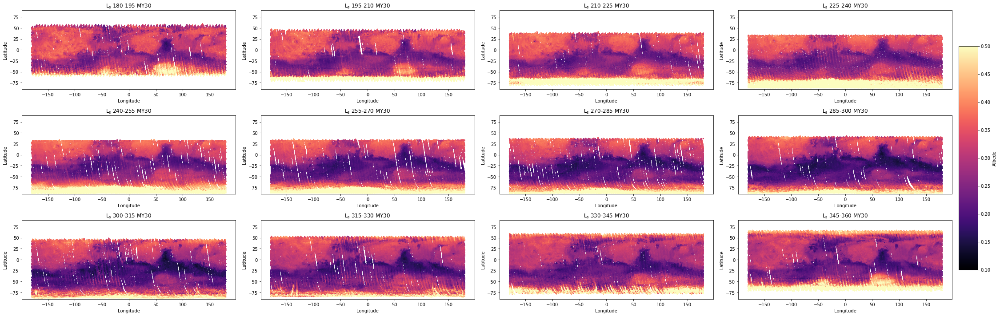

In [41]:
fig, axes = plt.subplots(3,4, sharex = False, sharey = False, figsize= (30,10))
plt.sca(axes[0,0])
plt.scatter(Alb30[1][12], Alb30[0][12],c=Alb30[2][12], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 180-195 MY30')
plt.ylim(-90.0,90.0)
plt.sca(axes[0,1])
plt.scatter(Alb30[1][13], Alb30[0][13],c=Alb30[2][13], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 195-210 MY30')
plt.ylim(-90.0,90.0)
plt.sca(axes[0,2])
plt.scatter(Alb30[1][14], Alb30[0][14],c=Alb30[2][14], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 210-225 MY30')
plt.ylim(-90.0,90.0)
plt.sca(axes[0,3])
plt.scatter(Alb30[1][15], Alb30[0][15],c=Alb30[2][15], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 225-240 MY30')
plt.ylim(-90.0,90.0)
plt.sca(axes[1,0])
plt.scatter(Alb30[1][16], Alb30[0][16],c=Alb30[2][16], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 240-255 MY30')
plt.ylim(-90.0,90.0)
plt.sca(axes[1,1])
plt.scatter(Alb30[1][17], Alb30[0][17],c=Alb30[2][17], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 255-270 MY30')
plt.ylim(-90.0,90.0)
plt.sca(axes[1,2])
plt.scatter(Alb30[1][18], Alb30[0][18],c=Alb30[2][18], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 270-285 MY30')
plt.ylim(-90.0,90.0)
plt.sca(axes[1,3])
plt.scatter(Alb30[1][19], Alb30[0][19],c=Alb30[2][19], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 285-300 MY30')
plt.ylim(-90.0,90.0)
plt.sca(axes[2,0])
plt.scatter(Alb30[1][20], Alb30[0][20],c=Alb30[2][20], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 300-315 MY30')
plt.ylim(-90.0,90.0)
plt.sca(axes[2,1])
plt.scatter(Alb30[1][21], Alb30[0][21],c=Alb30[2][21], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 315-330 MY30')
plt.ylim(-90.0,90.0)
plt.sca(axes[2,2])
plt.scatter(Alb30[1][22], Alb30[0][22],c=Alb30[2][22], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 330-345 MY30')
plt.ylim(-90.0,90.0)
plt.sca(axes[2,3])
plt.scatter(Alb30[1][23], Alb30[0][23],c=Alb30[2][23], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 345-360 MY30')
plt.ylim(-90.0,90.0)
plt.tight_layout()
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])
cbar = plt.colorbar(cax=cbar_ax)
cbar.set_label('Albedo')
plt.show()

# Plots for Martian Year 31, JD2455818-2456505

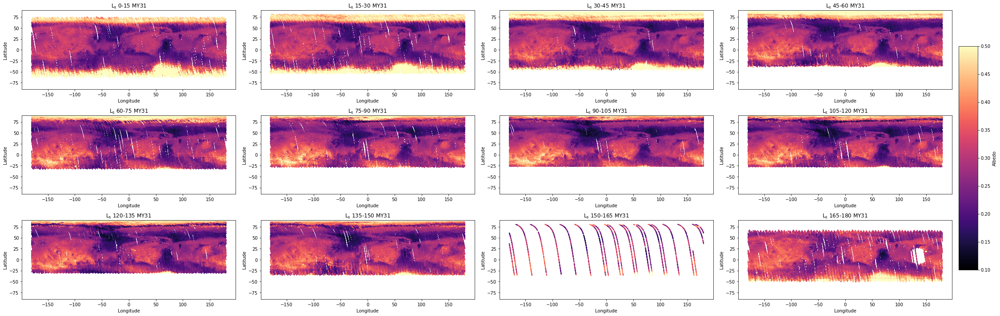

In [42]:
fig, axes = plt.subplots(3,4, sharex = False, sharey = False, figsize= (30,10))
plt.sca(axes[0,0])
plt.scatter(Alb31[1][0], Alb31[0][0],c=Alb31[2][0], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 0-15 MY31')
plt.ylim(-90.0,90.0)
plt.sca(axes[0,1])
plt.scatter(Alb31[1][1], Alb31[0][1],c=Alb31[2][1], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 15-30 MY31')
plt.ylim(-90.0,90.0)
plt.sca(axes[0,2])
plt.scatter(Alb31[1][2], Alb31[0][2],c=Alb31[2][2], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 30-45 MY31')
plt.ylim(-90.0,90.0)
plt.sca(axes[0,3])
plt.scatter(Alb31[1][3], Alb31[0][3],c=Alb31[2][3], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 45-60 MY31')
plt.ylim(-90.0,90.0)
plt.sca(axes[1,0])
plt.scatter(Alb31[1][4], Alb31[0][4],c=Alb31[2][4], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 60-75 MY31')
plt.ylim(-90.0,90.0)
plt.sca(axes[1,1])
plt.scatter(Alb31[1][5], Alb31[0][5],c=Alb31[2][5], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 75-90 MY31')
plt.ylim(-90.0,90.0)
plt.sca(axes[1,2])
plt.scatter(Alb31[1][6], Alb31[0][6],c=Alb31[2][6], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 90-105 MY31')
plt.ylim(-90.0,90.0)
plt.sca(axes[1,3])
plt.scatter(Alb31[1][7], Alb31[0][7],c=Alb31[2][7], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 105-120 MY31')
plt.ylim(-90.0,90.0)
plt.sca(axes[2,0])
plt.scatter(Alb31[1][8], Alb31[0][8],c=Alb31[2][8], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 120-135 MY31')
plt.ylim(-90.0,90.0)
plt.sca(axes[2,1])
plt.scatter(Alb31[1][9], Alb31[0][9],c=Alb31[2][9], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 135-150 MY31')
plt.ylim(-90.0,90.0)
plt.sca(axes[2,2])
plt.scatter(Alb31[1][10], Alb31[0][10],c=Alb31[2][10], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 150-165 MY31')
plt.ylim(-90.0,90.0)
plt.sca(axes[2,3])
plt.scatter(Alb31[1][11], Alb31[0][11],c=Alb31[2][11], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 165-180 MY31')
plt.ylim(-90.0,90.0)
plt.tight_layout()
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])
cbar = plt.colorbar(cax=cbar_ax)
cbar.set_label('Albedo')
plt.show()

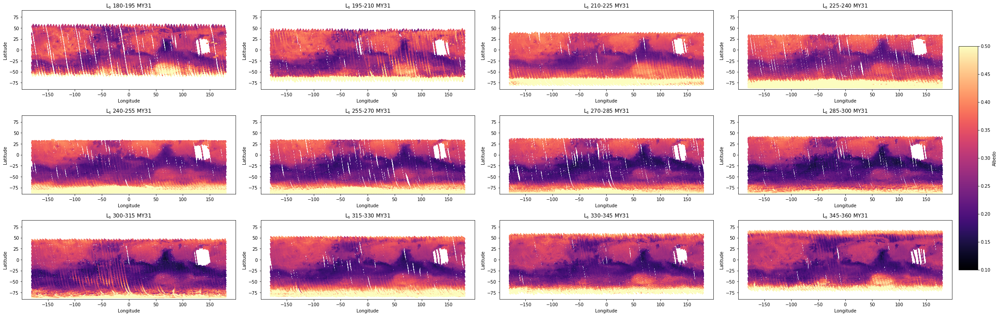

In [43]:
fig, axes = plt.subplots(3,4, sharex = False, sharey = False, figsize= (30,10))
plt.sca(axes[0,0])
plt.scatter(Alb31[1][12], Alb31[0][12],c=Alb31[2][12], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 180-195 MY31')
plt.ylim(-90.0,90.0)
plt.sca(axes[0,1])
plt.scatter(Alb31[1][13], Alb31[0][13],c=Alb31[2][13], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 195-210 MY31')
plt.ylim(-90.0,90.0)
plt.sca(axes[0,2])
plt.scatter(Alb31[1][14], Alb31[0][14],c=Alb31[2][14], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 210-225 MY31')
plt.ylim(-90.0,90.0)
plt.sca(axes[0,3])
plt.scatter(Alb31[1][15], Alb31[0][15],c=Alb31[2][15], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 225-240 MY31')
plt.ylim(-90.0,90.0)
plt.sca(axes[1,0])
plt.scatter(Alb31[1][16], Alb31[0][16],c=Alb31[2][16], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 240-255 MY31')
plt.ylim(-90.0,90.0)
plt.sca(axes[1,1])
plt.scatter(Alb31[1][17], Alb31[0][17],c=Alb31[2][17], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 255-270 MY31')
plt.ylim(-90.0,90.0)
plt.sca(axes[1,2])
plt.scatter(Alb31[1][18], Alb31[0][18],c=Alb31[2][18], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 270-285 MY31')
plt.ylim(-90.0,90.0)
plt.sca(axes[1,3])
plt.scatter(Alb31[1][19], Alb31[0][19],c=Alb31[2][19], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 285-300 MY31')
plt.ylim(-90.0,90.0)
plt.sca(axes[2,0])
plt.scatter(Alb31[1][20], Alb31[0][20],c=Alb31[2][20], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 300-315 MY31')
plt.ylim(-90.0,90.0)
plt.sca(axes[2,1])
plt.scatter(Alb31[1][21], Alb31[0][21],c=Alb31[2][21], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 315-330 MY31')
plt.ylim(-90.0,90.0)
plt.sca(axes[2,2])
plt.scatter(Alb31[1][22], Alb31[0][22],c=Alb31[2][22], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 330-345 MY31')
plt.ylim(-90.0,90.0)
plt.sca(axes[2,3])
plt.scatter(Alb31[1][23], Alb31[0][23],c=Alb31[2][23], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 345-360 MY31')
plt.ylim(-90.0,90.0)
plt.tight_layout()
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])
cbar = plt.colorbar(cax=cbar_ax)
cbar.set_label('Albedo')
plt.show()

# Plots for Martian Year 32, JD2456505-2457192

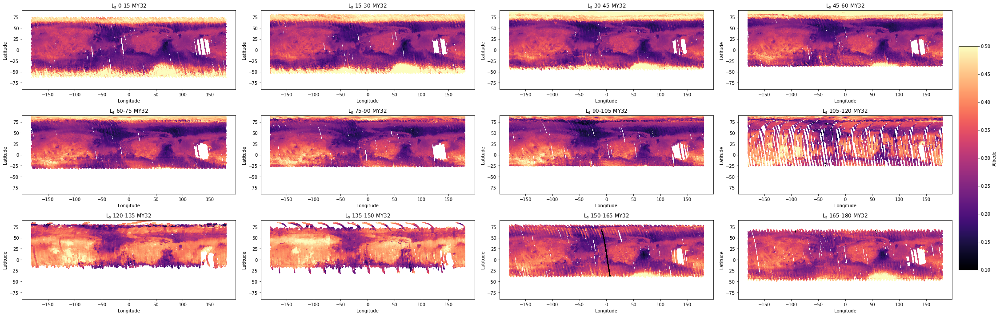

In [44]:
fig, axes = plt.subplots(3,4, sharex = False, sharey = False, figsize= (30,10))
plt.sca(axes[0,0])
plt.scatter(Alb32[1][0], Alb32[0][0],c=Alb32[2][0], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 0-15 MY32')
plt.ylim(-90.0,90.0)
plt.sca(axes[0,1])
plt.scatter(Alb32[1][1], Alb32[0][1],c=Alb32[2][1], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 15-30 MY32')
plt.ylim(-90.0,90.0)
plt.sca(axes[0,2])
plt.scatter(Alb32[1][2], Alb32[0][2],c=Alb32[2][2], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 30-45 MY32')
plt.ylim(-90.0,90.0)
plt.sca(axes[0,3])
plt.scatter(Alb32[1][3], Alb32[0][3],c=Alb32[2][3], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 45-60 MY32')
plt.ylim(-90.0,90.0)
plt.sca(axes[1,0])
plt.scatter(Alb32[1][4], Alb32[0][4],c=Alb32[2][4], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 60-75 MY32')
plt.ylim(-90.0,90.0)
plt.sca(axes[1,1])
plt.scatter(Alb32[1][5], Alb32[0][5],c=Alb32[2][5], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 75-90 MY32')
plt.ylim(-90.0,90.0)
plt.sca(axes[1,2])
plt.scatter(Alb32[1][6], Alb32[0][6],c=Alb32[2][6], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 90-105 MY32')
plt.ylim(-90.0,90.0)
plt.sca(axes[1,3])
plt.scatter(Alb32[1][7], Alb32[0][7],c=Alb32[2][7], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 105-120 MY32')
plt.ylim(-90.0,90.0)
plt.sca(axes[2,0])
plt.scatter(Alb32[1][8], Alb32[0][8],c=Alb32[2][8], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 120-135 MY32')
plt.ylim(-90.0,90.0)
plt.sca(axes[2,1])
plt.scatter(Alb32[1][9], Alb32[0][9],c=Alb32[2][9], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 135-150 MY32')
plt.ylim(-90.0,90.0)
plt.sca(axes[2,2])
plt.scatter(Alb32[1][10], Alb32[0][10],c=Alb32[2][10], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 150-165 MY32')
plt.ylim(-90.0,90.0)
plt.sca(axes[2,3])
plt.scatter(Alb32[1][11], Alb32[0][11],c=Alb32[2][11], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 165-180 MY32')
plt.ylim(-90.0,90.0)
plt.tight_layout()
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])
cbar = plt.colorbar(cax=cbar_ax)
cbar.set_label('Albedo')
plt.show()

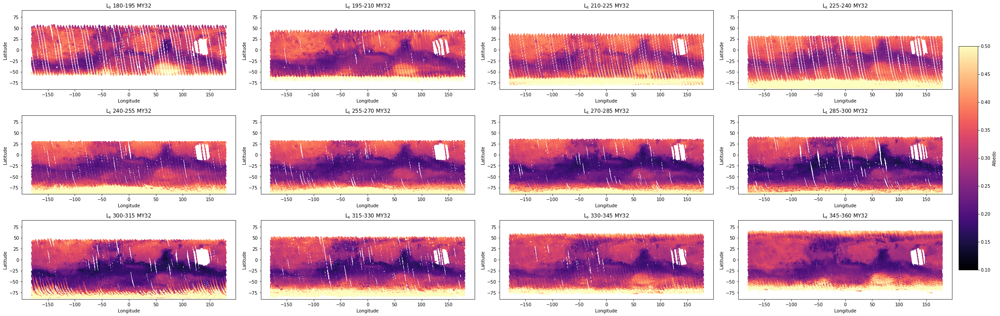

In [45]:
fig, axes = plt.subplots(3,4, sharex = False, sharey = False, figsize= (30,10))
plt.sca(axes[0,0])
plt.scatter(Alb32[1][12], Alb32[0][12],c=Alb32[2][12], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 180-195 MY32')
plt.ylim(-90.0,90.0)
plt.sca(axes[0,1])
plt.scatter(Alb32[1][13], Alb32[0][13],c=Alb32[2][13], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 195-210 MY32')
plt.ylim(-90.0,90.0)
plt.sca(axes[0,2])
plt.scatter(Alb32[1][14], Alb32[0][14],c=Alb32[2][14], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 210-225 MY32')
plt.ylim(-90.0,90.0)
plt.sca(axes[0,3])
plt.scatter(Alb32[1][15], Alb32[0][15],c=Alb32[2][15], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 225-240 MY32')
plt.ylim(-90.0,90.0)
plt.sca(axes[1,0])
plt.scatter(Alb32[1][16], Alb32[0][16],c=Alb32[2][16], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 240-255 MY32')
plt.ylim(-90.0,90.0)
plt.sca(axes[1,1])
plt.scatter(Alb32[1][17], Alb32[0][17],c=Alb32[2][17], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 255-270 MY32')
plt.ylim(-90.0,90.0)
plt.sca(axes[1,2])
plt.scatter(Alb32[1][18], Alb32[0][18],c=Alb32[2][18], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 270-285 MY32')
plt.ylim(-90.0,90.0)
plt.sca(axes[1,3])
plt.scatter(Alb32[1][19], Alb32[0][19],c=Alb32[2][19], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 285-300 MY32')
plt.ylim(-90.0,90.0)
plt.sca(axes[2,0])
plt.scatter(Alb32[1][20], Alb32[0][20],c=Alb32[2][20], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 300-315 MY32')
plt.ylim(-90.0,90.0)
plt.sca(axes[2,1])
plt.scatter(Alb32[1][21], Alb32[0][21],c=Alb32[2][21], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 315-330 MY32')
plt.ylim(-90.0,90.0)
plt.sca(axes[2,2])
plt.scatter(Alb32[1][22], Alb32[0][22],c=Alb32[2][22], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 330-345 MY32')
plt.ylim(-90.0,90.0)
plt.sca(axes[2,3])
plt.scatter(Alb32[1][23], Alb32[0][23],c=Alb32[2][23], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 345-360 MY32')
plt.ylim(-90.0,90.0)
plt.tight_layout()
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])
cbar = plt.colorbar(cax=cbar_ax)
cbar.set_label('Albedo')
plt.show()

# Plots for Martian Year 33,  JD2457192-2457879

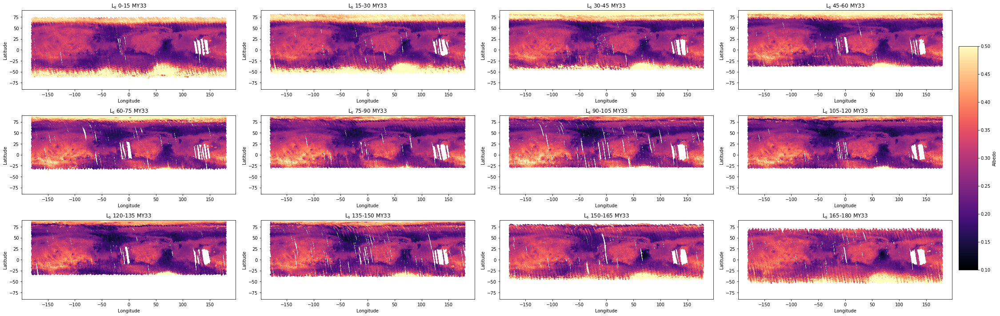

In [46]:
fig, axes = plt.subplots(3,4, sharex = False, sharey = False, figsize= (30,10))
plt.sca(axes[0,0])
plt.scatter(Alb33[1][0], Alb33[0][0],c=Alb33[2][0], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 0-15 MY33')
plt.ylim(-90.0,90.0)
plt.sca(axes[0,1])
plt.scatter(Alb33[1][1], Alb33[0][1],c=Alb33[2][1], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 15-30 MY33')
plt.ylim(-90.0,90.0)
plt.sca(axes[0,2])
plt.scatter(Alb33[1][2], Alb33[0][2],c=Alb33[2][2], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 30-45 MY33')
plt.ylim(-90.0,90.0)
plt.sca(axes[0,3])
plt.scatter(Alb33[1][3], Alb33[0][3],c=Alb33[2][3], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 45-60 MY33')
plt.ylim(-90.0,90.0)
plt.sca(axes[1,0])
plt.scatter(Alb33[1][4], Alb33[0][4],c=Alb33[2][4], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 60-75 MY33')
plt.ylim(-90.0,90.0)
plt.sca(axes[1,1])
plt.scatter(Alb33[1][5], Alb33[0][5],c=Alb33[2][5], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 75-90 MY33')
plt.ylim(-90.0,90.0)
plt.sca(axes[1,2])
plt.scatter(Alb33[1][6], Alb33[0][6],c=Alb33[2][6], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 90-105 MY33')
plt.ylim(-90.0,90.0)
plt.sca(axes[1,3])
plt.scatter(Alb33[1][7], Alb33[0][7],c=Alb33[2][7], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 105-120 MY33')
plt.ylim(-90.0,90.0)
plt.sca(axes[2,0])
plt.scatter(Alb33[1][8], Alb33[0][8],c=Alb33[2][8], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 120-135 MY33')
plt.ylim(-90.0,90.0)
plt.sca(axes[2,1])
plt.scatter(Alb33[1][9], Alb33[0][9],c=Alb33[2][9], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 135-150 MY33')
plt.ylim(-90.0,90.0)
plt.sca(axes[2,2])
plt.scatter(Alb33[1][10], Alb33[0][10],c=Alb33[2][10], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 150-165 MY33')
plt.ylim(-90.0,90.0)
plt.sca(axes[2,3])
plt.scatter(Alb33[1][11], Alb33[0][11],c=Alb33[2][11], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 165-180 MY33')
plt.ylim(-90.0,90.0)
plt.tight_layout()
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])
cbar = plt.colorbar(cax=cbar_ax)
cbar.set_label('Albedo')
plt.show()

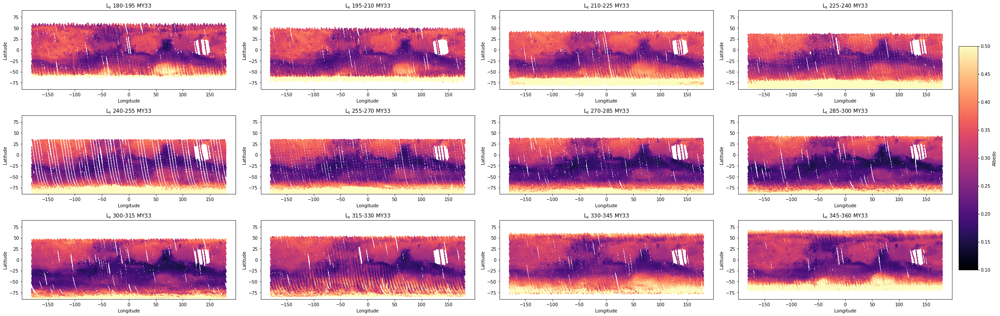

In [47]:
fig, axes = plt.subplots(3,4, sharex = False, sharey = False, figsize= (30,10))
plt.sca(axes[0,0])
plt.scatter(Alb33[1][12], Alb33[0][12],c=Alb33[2][12], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 180-195 MY33')
plt.ylim(-90.0,90.0)
plt.sca(axes[0,1])
plt.scatter(Alb33[1][13], Alb33[0][13],c=Alb33[2][13], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 195-210 MY33')
plt.ylim(-90.0,90.0)
plt.sca(axes[0,2])
plt.scatter(Alb33[1][14], Alb33[0][14],c=Alb33[2][14], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 210-225 MY33')
plt.ylim(-90.0,90.0)
plt.sca(axes[0,3])
plt.scatter(Alb33[1][15], Alb33[0][15],c=Alb33[2][15], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 225-240 MY33')
plt.ylim(-90.0,90.0)
plt.sca(axes[1,0])
plt.scatter(Alb33[1][16], Alb33[0][16],c=Alb33[2][16], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 240-255 MY33')
plt.ylim(-90.0,90.0)
plt.sca(axes[1,1])
plt.scatter(Alb33[1][17], Alb33[0][17],c=Alb33[2][17], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 255-270 MY33')
plt.ylim(-90.0,90.0)
plt.sca(axes[1,2])
plt.scatter(Alb33[1][18], Alb33[0][18],c=Alb33[2][18], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 270-285 MY33')
plt.ylim(-90.0,90.0)
plt.sca(axes[1,3])
plt.scatter(Alb33[1][19], Alb33[0][19],c=Alb33[2][19], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 285-300 MY33')
plt.ylim(-90.0,90.0)
plt.sca(axes[2,0])
plt.scatter(Alb33[1][20], Alb33[0][20],c=Alb33[2][20], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 300-315 MY33')
plt.ylim(-90.0,90.0)
plt.sca(axes[2,1])
plt.scatter(Alb33[1][21], Alb33[0][21],c=Alb33[2][21], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 315-330 MY33')
plt.ylim(-90.0,90.0)
plt.sca(axes[2,2])
plt.scatter(Alb33[1][22], Alb33[0][22],c=Alb33[2][22], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 330-345 MY33')
plt.ylim(-90.0,90.0)
plt.sca(axes[2,3])
plt.scatter(Alb33[1][23], Alb33[0][23],c=Alb33[2][23], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('$\mathregular{L_s}$ 345-360 MY33')
plt.ylim(-90.0,90.0)
plt.tight_layout()
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])
cbar = plt.colorbar(cax=cbar_ax)
cbar.set_label('Albedo')
plt.show()

# Albedo Analysis

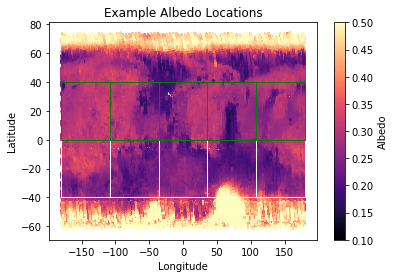

In [48]:
fig= plt.figure(2)
ax = fig.add_subplot(1,1,1)
img  = ax.scatter(Alb29[1][0], Alb29[0][0],c=Alb29[2][0], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
rect = patches.Rectangle((-180,-40),72,40,linewidth=1,edgecolor='w',facecolor='none', label = 'NA')
rect2 = patches.Rectangle((-180,0),72,40,linewidth=1,edgecolor='g',facecolor='none')
rect3 = patches.Rectangle((-108,-40),72,40,linewidth=1,edgecolor='w',facecolor='none')
rect4 = patches.Rectangle((-108,0),72,40,linewidth=1,edgecolor='g',facecolor='none')
rect5 = patches.Rectangle((-36,-40),72,40,linewidth=1,edgecolor='w',facecolor='none')
rect6 = patches.Rectangle((-36,0),72,40,linewidth=1,edgecolor='g',facecolor='none')
rect7 = patches.Rectangle((36,-40),72,40,linewidth=1,edgecolor='w',facecolor='none')
rect8 = patches.Rectangle((36,0),72,40,linewidth=1,edgecolor='g',facecolor='none')
rect9 = patches.Rectangle((108,-40),72,40,linewidth=1,edgecolor='w',facecolor='none')
rect10 = patches.Rectangle((108,0),72,40,linewidth=1,edgecolor='g',facecolor='none')
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('Example Albedo Locations')
ax.add_patch(rect)
ax.add_patch(rect2)
ax.add_patch(rect3)
ax.add_patch(rect4)
ax.add_patch(rect5)
ax.add_patch(rect6)
ax.add_patch(rect7)
ax.add_patch(rect8)
ax.add_patch(rect9)
ax.add_patch(rect10)
cbar = fig.colorbar(img, label = 'Albedo')
plt.show()

In [49]:
MY29_CloudySA = SubDict(MY29, RanLong=[-180,-108], RanLat=[-40.0,0.0])
MY29_CloudyNA = SubDict(MY29, RanLong=[-180,-108], RanLat=[0.0,40.0])
CloudyStatsM29SA = SubStats(MY29_CloudySA)
CloudyStatsM29NA = SubStats(MY29_CloudyNA)

In [50]:
MY30_CloudySA = SubDict(MY30, RanLong=[-180,-108], RanLat=[-40.0,0.0])
MY30_CloudyNA = SubDict(MY30, RanLong=[-180,-108], RanLat=[0.0,40.0])
CloudyStatsM30SA = SubStats(MY30_CloudySA)
CloudyStatsM30NA = SubStats(MY30_CloudyNA)

In [51]:
MY31_CloudySA = SubDict(MY31, RanLong=[-180,-108], RanLat=[-40.0,0.0])
MY31_CloudyNA = SubDict(MY31, RanLong=[-180,-108], RanLat=[0.0,40.0])
CloudyStatsM31SA = SubStats(MY31_CloudySA)
CloudyStatsM31NA = SubStats(MY31_CloudyNA)

In [52]:
MY32_CloudySA = SubDict(MY32, RanLong=[-180,-108], RanLat=[-40.0,0.0])
MY32_CloudyNA = SubDict(MY32, RanLong=[-180,-108], RanLat=[0.0,40.0])
CloudyStatsM32SA = SubStats(MY32_CloudySA)
CloudyStatsM32NA = SubStats(MY32_CloudyNA)

In [53]:
MY33_CloudySA = SubDict(MY33, RanLong=[-180,-108], RanLat=[-40.0,0.0])
MY33_CloudyNA = SubDict(MY33, RanLong=[-180,-108], RanLat=[0.0,40.0])
CloudyStatsM33SA = SubStats(MY33_CloudySA)
CloudyStatsM33NA = SubStats(MY33_CloudyNA)

In [54]:
MY29_CloudySB = SubDict(MY29, RanLong=[-108,-36], RanLat=[-40.0,0.0])
MY29_CloudyNB = SubDict(MY29, RanLong=[-108,-36], RanLat=[0.0,40.0])
CloudyStatsM29SB = SubStats(MY29_CloudySB)
CloudyStatsM29NB = SubStats(MY29_CloudyNB)

In [55]:
MY30_CloudySB = SubDict(MY30, RanLong=[-108,-36], RanLat=[-40.0,0.0])
MY30_CloudyNB = SubDict(MY30, RanLong=[-108,-36], RanLat=[0.0,40.0])
CloudyStatsM30SB = SubStats(MY30_CloudySB)
CloudyStatsM30NB = SubStats(MY30_CloudyNB)

In [56]:
MY31_CloudySB = SubDict(MY31, RanLong=[-108,-36], RanLat=[-40.0,0.0])
MY31_CloudyNB = SubDict(MY31, RanLong=[-108,-36], RanLat=[0.0,40.0])
CloudyStatsM31SB = SubStats(MY31_CloudySB)
CloudyStatsM31NB = SubStats(MY31_CloudyNB)

In [57]:
MY32_CloudySB = SubDict(MY32, RanLong=[-108,-36], RanLat=[-40.0,0.0])
MY32_CloudyNB = SubDict(MY32, RanLong=[-108,-36], RanLat=[0.0,40.0])
CloudyStatsM32SB = SubStats(MY32_CloudySB)
CloudyStatsM32NB = SubStats(MY32_CloudyNB)

In [58]:
MY33_CloudySB = SubDict(MY33, RanLong=[-36,36], RanLat=[-40.0,0.0])
MY33_CloudyNB = SubDict(MY33, RanLong=[-36,36], RanLat=[0.0,40.0])
CloudyStatsM33SB = SubStats(MY33_CloudySB)
CloudyStatsM33NB = SubStats(MY33_CloudyNB)

In [59]:
MY29_CloudySC = SubDict(MY29, RanLong=[-36,36], RanLat=[-40.0,0.0])
MY29_CloudyNC = SubDict(MY29, RanLong=[-36,36], RanLat=[0.0,40.0])
CloudyStatsM29SC = SubStats(MY29_CloudySC)
CloudyStatsM29NC = SubStats(MY29_CloudyNC)

In [60]:
MY30_CloudySC = SubDict(MY30, RanLong=[-36,36], RanLat=[-40.0,0.0])
MY30_CloudyNC = SubDict(MY30, RanLong=[-36,36], RanLat=[0.0,40.0])
CloudyStatsM30SC = SubStats(MY30_CloudySC)
CloudyStatsM30NC = SubStats(MY30_CloudyNC)

In [61]:
MY31_CloudySC = SubDict(MY31, RanLong=[-36,36], RanLat=[-40.0,0.0])
MY31_CloudyNC = SubDict(MY31, RanLong=[-36,36], RanLat=[0.0,40.0])
CloudyStatsM31SC = SubStats(MY31_CloudySC)
CloudyStatsM31NC = SubStats(MY31_CloudyNC)

In [62]:
MY32_CloudySC = SubDict(MY32, RanLong=[-36,36], RanLat=[-40.0,0.0])
MY32_CloudyNC = SubDict(MY32, RanLong=[-36,36], RanLat=[0.0,40.0])
CloudyStatsM32SC = SubStats(MY32_CloudySC)
CloudyStatsM32NC = SubStats(MY32_CloudyNC)

In [63]:
MY33_CloudySC = SubDict(MY33, RanLong=[-36,36], RanLat=[-40.0,0.0])
MY33_CloudyNC = SubDict(MY33, RanLong=[-36,36], RanLat=[0.0,40.0])
CloudyStatsM33SC = SubStats(MY33_CloudySC)
CloudyStatsM33NC = SubStats(MY33_CloudyNC)

In [64]:
MY29_CloudySD = SubDict(MY29, RanLong=[36,108], RanLat=[-40.0,0.0])
MY29_CloudyND = SubDict(MY29, RanLong=[36,108], RanLat=[0.0,40.0])
CloudyStatsM29SD = SubStats(MY29_CloudySD)
CloudyStatsM29ND = SubStats(MY29_CloudyND)

In [65]:
MY30_CloudySD = SubDict(MY30, RanLong=[36,108], RanLat=[-40.0,0.0])
MY30_CloudyND = SubDict(MY30, RanLong=[36,108], RanLat=[0.0,40.0])
CloudyStatsM30SD = SubStats(MY30_CloudySD)
CloudyStatsM30ND = SubStats(MY30_CloudyND)

In [66]:
MY31_CloudySD = SubDict(MY31, RanLong=[36,108], RanLat=[-40.0,0.0])
MY31_CloudyND = SubDict(MY31, RanLong=[36,108], RanLat=[0.0,40.0])
CloudyStatsM31SD = SubStats(MY31_CloudySD)
CloudyStatsM31ND = SubStats(MY31_CloudyND)

In [67]:
MY32_CloudySD = SubDict(MY32, RanLong=[36,108], RanLat=[-40.0,0.0])
MY32_CloudyND = SubDict(MY32, RanLong=[36,108], RanLat=[0.0,40.0])
CloudyStatsM32SD = SubStats(MY32_CloudySD)
CloudyStatsM32ND = SubStats(MY32_CloudyND)

In [68]:
MY33_CloudySD = SubDict(MY33, RanLong=[36,108], RanLat=[-40.0,0.0])
MY33_CloudyND = SubDict(MY33, RanLong=[36,108], RanLat=[0.0,40.0])
CloudyStatsM33SD = SubStats(MY33_CloudySD)
CloudyStatsM33ND = SubStats(MY33_CloudyND)

In [69]:
MY29_CloudySE = SubDict(MY29, RanLong=[108, 180], RanLat=[-40.0,0.0])
MY29_CloudyNE = SubDict(MY29, RanLong=[108, 180], RanLat=[0.0,40.0])
CloudyStatsM29SE = SubStats(MY29_CloudySE)
CloudyStatsM29NE = SubStats(MY29_CloudyNE)

In [70]:
MY30_CloudySE = SubDict(MY30, RanLong=[108, 180], RanLat=[-40.0,0.0])
MY30_CloudyNE = SubDict(MY30, RanLong=[108, 180], RanLat=[0.0,40.0])
CloudyStatsM30SE = SubStats(MY30_CloudySE)
CloudyStatsM30NE = SubStats(MY30_CloudyNE)

In [71]:
MY31_CloudySE = SubDict(MY31, RanLong=[108, 180], RanLat=[-40.0,0.0])
MY31_CloudyNE = SubDict(MY31, RanLong=[108, 180], RanLat=[0.0,40.0])
CloudyStatsM31SE = SubStats(MY31_CloudySE)
CloudyStatsM31NE = SubStats(MY31_CloudyNE)

In [72]:
MY32_CloudySE = SubDict(MY32, RanLong=[108, 180], RanLat=[-40.0,0.0])
MY32_CloudyNE = SubDict(MY32, RanLong=[108, 180], RanLat=[0.0,40.0])
CloudyStatsM32SE = SubStats(MY32_CloudySE)
CloudyStatsM32NE = SubStats(MY32_CloudyNE)

In [73]:
MY33_CloudySE = SubDict(MY33, RanLong=[108, 180], RanLat=[-40.0,0.0])
MY33_CloudyNE = SubDict(MY33, RanLong=[108, 180], RanLat=[0.0,40.0])
CloudyStatsM33SE = SubStats(MY33_CloudySE)
CloudyStatsM33NE = SubStats(MY33_CloudyNE)

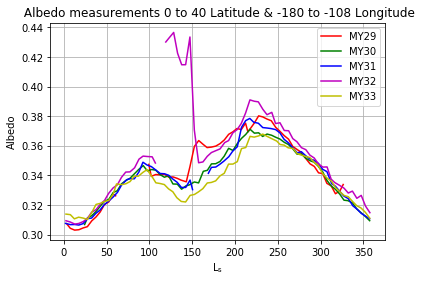

In [74]:
plt.plot(CloudyStatsM29NA[2],CloudyStatsM29NA[0], color ='r',   label = 'MY29')
plt.plot(CloudyStatsM30NA[2],CloudyStatsM30NA[0], color ='g',   label = 'MY30')
plt.plot(CloudyStatsM31NA[2],CloudyStatsM31NA[0], color ='b',   label = 'MY31')
plt.plot(CloudyStatsM32NA[2],CloudyStatsM32NA[0], color ='m',   label = 'MY32')
plt.plot(CloudyStatsM33NA[2],CloudyStatsM33NA[0], color ='y',   label = 'MY33')
plt.xlabel('$\mathregular{L_s}$')
plt.ylabel('Albedo')
plt.title(' Albedo measurements 0 to 40 Latitude & -180 to -108 Longitude')
plt.legend()
plt.grid()
plt.show()

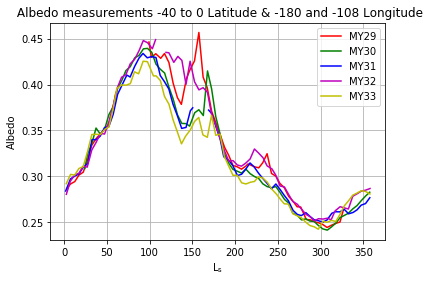

In [75]:
plt.plot(CloudyStatsM29SA[2],CloudyStatsM29SA[0], color ='r', label = 'MY29')
plt.plot(CloudyStatsM30SA[2],CloudyStatsM30SA[0], color ='g', label = 'MY30')
plt.plot(CloudyStatsM31SA[2],CloudyStatsM31SA[0], color ='b', label = 'MY31')
plt.plot(CloudyStatsM32SA[2],CloudyStatsM32SA[0], color ='m', label = 'MY32')
plt.plot(CloudyStatsM33SA[2],CloudyStatsM33SA[0], color ='y', label = 'MY33')
plt.xlabel('$\mathregular{L_s}$')
plt.ylabel('Albedo')
plt.title(' Albedo measurements -40 to 0 Latitude & -180 and -108 Longitude')
plt.legend()
plt.grid()
plt.show()

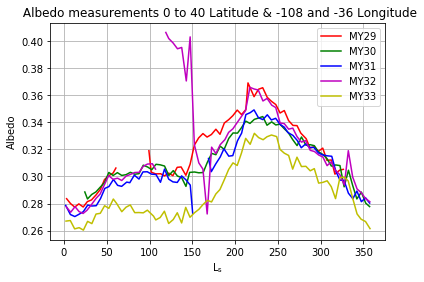

In [76]:
plt.plot(CloudyStatsM29NB[2],CloudyStatsM29NB[0], color ='r', label = 'MY29')
plt.plot(CloudyStatsM30NB[2],CloudyStatsM30NB[0], color ='g', label = 'MY30')
plt.plot(CloudyStatsM31NB[2],CloudyStatsM31NB[0], color ='b', label = 'MY31')
plt.plot(CloudyStatsM32NB[2],CloudyStatsM32NB[0], color ='m', label = 'MY32')
plt.plot(CloudyStatsM33NB[2],CloudyStatsM33NB[0], color ='y', label = 'MY33')
plt.xlabel('$\mathregular{L_s}$')
plt.ylabel('Albedo')
plt.title(' Albedo measurements 0 to 40 Latitude & -108 and -36 Longitude')
plt.legend()
plt.grid()
plt.show()

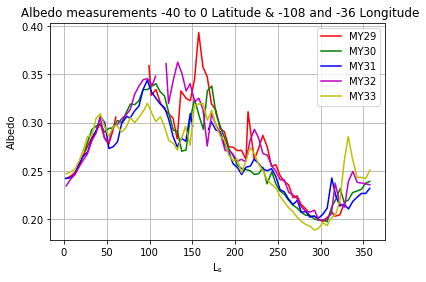

In [77]:
plt.plot(CloudyStatsM29SB[2],CloudyStatsM29SB[0], color ='r',  label = 'MY29')
plt.plot(CloudyStatsM30SB[2],CloudyStatsM30SB[0], color ='g',  label = 'MY30')
plt.plot(CloudyStatsM31SB[2],CloudyStatsM31SB[0], color ='b',  label = 'MY31')
plt.plot(CloudyStatsM32SB[2],CloudyStatsM32SB[0], color ='m',  label = 'MY32')
plt.plot(CloudyStatsM33SB[2],CloudyStatsM33SB[0], color ='y',  label = 'MY33')
plt.xlabel('$\mathregular{L_s}$')
plt.ylabel('Albedo')
plt.title(' Albedo measurements -40 to 0 Latitude & -108 and -36 Longitude')
plt.legend()
plt.grid()
plt.show()

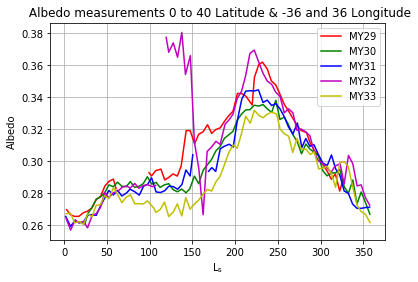

In [78]:
plt.plot(CloudyStatsM29NC[2],CloudyStatsM29NC[0], color ='r', label = 'MY29')
plt.plot(CloudyStatsM30NC[2],CloudyStatsM30NC[0], color ='g', label = 'MY30')
plt.plot(CloudyStatsM31NC[2],CloudyStatsM31NC[0], color ='b', label = 'MY31')
plt.plot(CloudyStatsM32NC[2],CloudyStatsM32NC[0], color ='m', label = 'MY32')
plt.plot(CloudyStatsM33NC[2],CloudyStatsM33NC[0], color ='y', label = 'MY33')
plt.xlabel('$\mathregular{L_s}$')
plt.ylabel('Albedo')
plt.title(' Albedo measurements 0 to 40 Latitude & -36 and 36 Longitude')
plt.legend()
plt.grid()
plt.show()

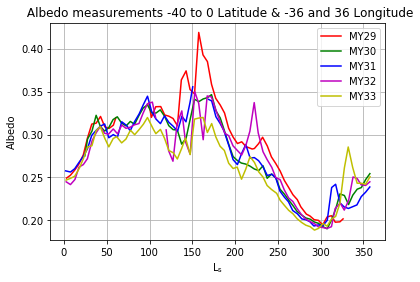

In [79]:
plt.plot(CloudyStatsM29SC[2],CloudyStatsM29SC[0], color ='r',  label = 'MY29')
plt.plot(CloudyStatsM30SC[2],CloudyStatsM30SC[0], color ='g',  label = 'MY30')
plt.plot(CloudyStatsM31SC[2],CloudyStatsM31SC[0], color ='b',  label = 'MY31')
plt.plot(CloudyStatsM32SC[2],CloudyStatsM32SC[0], color ='m',  label = 'MY32')
plt.plot(CloudyStatsM33SC[2],CloudyStatsM33SC[0], color ='y',  label = 'MY33')
plt.xlabel('$\mathregular{L_s}$')
plt.ylabel('Albedo')
plt.title(' Albedo measurements -40 to 0 Latitude & -36 and 36 Longitude')
plt.legend()
plt.grid()
plt.show()

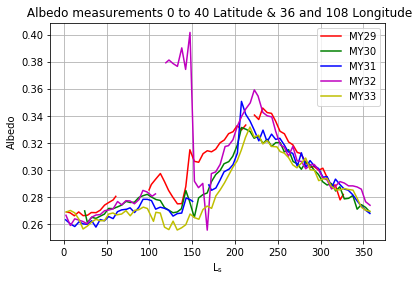

In [80]:
plt.plot(CloudyStatsM29ND[2],CloudyStatsM29ND[0], color ='r', label = 'MY29')
plt.plot(CloudyStatsM30ND[2],CloudyStatsM30ND[0], color ='g', label = 'MY30')
plt.plot(CloudyStatsM31ND[2],CloudyStatsM31ND[0], color ='b', label = 'MY31')
plt.plot(CloudyStatsM32ND[2],CloudyStatsM32ND[0], color ='m', label = 'MY32')
plt.plot(CloudyStatsM33ND[2],CloudyStatsM33ND[0], color ='y', label = 'MY33')
plt.xlabel('$\mathregular{L_s}$')
plt.ylabel('Albedo')
plt.title(' Albedo measurements 0 to 40 Latitude & 36 and 108 Longitude')
plt.legend()
plt.grid()
plt.show()

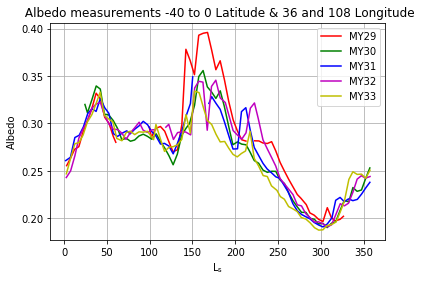

In [81]:
plt.plot(CloudyStatsM29SD[2],CloudyStatsM29SD[0], color ='r', label = 'MY29')
plt.plot(CloudyStatsM30SD[2],CloudyStatsM30SD[0], color ='g', label = 'MY30')
plt.plot(CloudyStatsM31SD[2],CloudyStatsM31SD[0], color ='b', label = 'MY31')
plt.plot(CloudyStatsM32SD[2],CloudyStatsM32SD[0], color ='m', label = 'MY32')
plt.plot(CloudyStatsM33SD[2],CloudyStatsM33SD[0], color ='y', label = 'MY33')
plt.xlabel('$\mathregular{L_s}$')
plt.ylabel('Albedo')
plt.title(' Albedo measurements -40 to 0 Latitude & 36 and 108 Longitude')
plt.legend()
plt.grid()
plt.show()

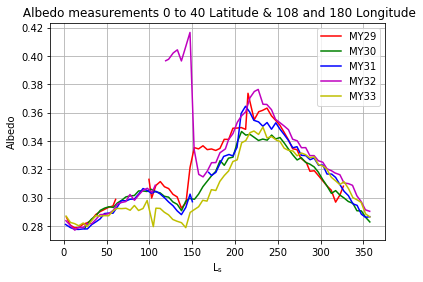

In [82]:
plt.plot(CloudyStatsM29NE[2],CloudyStatsM29NE[0], color ='r', label = 'MY29')
plt.plot(CloudyStatsM30NE[2],CloudyStatsM30NE[0], color ='g', label = 'MY30')
plt.plot(CloudyStatsM31NE[2],CloudyStatsM31NE[0], color ='b', label = 'MY31')
plt.plot(CloudyStatsM32NE[2],CloudyStatsM32NE[0], color ='m', label = 'MY32')
plt.plot(CloudyStatsM33NE[2],CloudyStatsM33NE[0], color ='y', label = 'MY33')
plt.xlabel('$\mathregular{L_s}$')
plt.ylabel('Albedo')
plt.title(' Albedo measurements 0 to 40 Latitude & 108 and 180 Longitude')
plt.legend()
plt.grid()
plt.show()

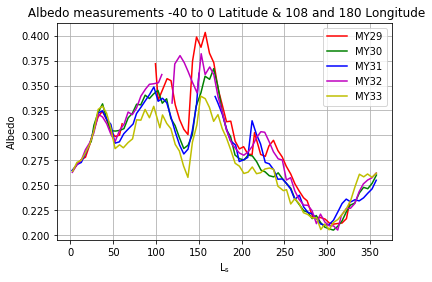

In [83]:
plt.plot(CloudyStatsM29SE[2],CloudyStatsM29SE[0], color ='r', label = 'MY29')
plt.plot(CloudyStatsM30SE[2],CloudyStatsM30SE[0], color ='g', label = 'MY30')
plt.plot(CloudyStatsM31SE[2],CloudyStatsM31SE[0], color ='b', label = 'MY31')
plt.plot(CloudyStatsM32SE[2],CloudyStatsM32SE[0], color ='m', label = 'MY32')
plt.plot(CloudyStatsM33SE[2],CloudyStatsM33SE[0], color ='y', label = 'MY33')
plt.xlabel('$\mathregular{L_s}$')
plt.ylabel('Albedo')
plt.title(' Albedo measurements -40 to 0 Latitude & 108 and 180 Longitude')
plt.legend()
plt.grid()
plt.show()

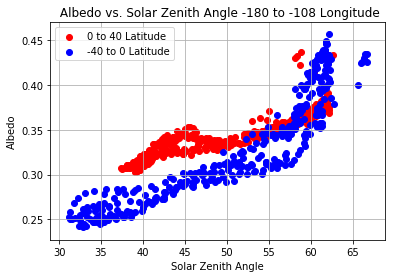

In [84]:
plt.scatter(CloudyStatsM29NA[3],CloudyStatsM29NA[0], color = 'r', label = '0 to 40 Latitude' )
plt.scatter(CloudyStatsM30NA[3],CloudyStatsM30NA[0], color = 'r')
plt.scatter(CloudyStatsM31NA[3],CloudyStatsM31NA[0], color = 'r')
plt.scatter(CloudyStatsM32NA[3],CloudyStatsM32NA[0], color = 'r')
plt.scatter(CloudyStatsM33NA[3],CloudyStatsM33NA[0], color = 'r')
plt.scatter(CloudyStatsM29SA[3],CloudyStatsM29SA[0], color = 'b', label = '-40 to 0 Latitude')
plt.scatter(CloudyStatsM30SA[3],CloudyStatsM30SA[0], color = 'b')
plt.scatter(CloudyStatsM31SA[3],CloudyStatsM31SA[0], color = 'b')
plt.scatter(CloudyStatsM32SA[3],CloudyStatsM32SA[0], color = 'b')
plt.scatter(CloudyStatsM33SA[3],CloudyStatsM33SA[0], color = 'b')
plt.legend()
plt.title(' Albedo vs. Solar Zenith Angle -180 to -108 Longitude')
plt.xlabel('Solar Zenith Angle')
plt.ylabel('Albedo')
plt.grid()
plt.show()

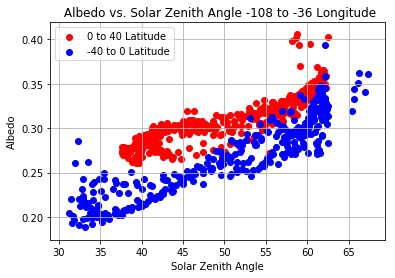

In [85]:
plt.scatter(CloudyStatsM29NB[3],CloudyStatsM29NB[0], color = 'r', label = '0 to 40 Latitude' )
plt.scatter(CloudyStatsM30NB[3],CloudyStatsM30NB[0], color = 'r')
plt.scatter(CloudyStatsM31NB[3],CloudyStatsM31NB[0], color = 'r')
plt.scatter(CloudyStatsM32NB[3],CloudyStatsM32NB[0], color = 'r')
plt.scatter(CloudyStatsM33NB[3],CloudyStatsM33NB[0], color = 'r')
plt.scatter(CloudyStatsM29SB[3],CloudyStatsM29SB[0], color = 'b', label = '-40 to 0 Latitude')
plt.scatter(CloudyStatsM30SB[3],CloudyStatsM30SB[0], color = 'b')
plt.scatter(CloudyStatsM31SB[3],CloudyStatsM31SB[0], color = 'b')
plt.scatter(CloudyStatsM32SB[3],CloudyStatsM32SB[0], color = 'b')
plt.scatter(CloudyStatsM33SB[3],CloudyStatsM33SB[0], color = 'b')
plt.legend()
plt.title(' Albedo vs. Solar Zenith Angle -108 to -36 Longitude')
plt.xlabel('Solar Zenith Angle')
plt.ylabel('Albedo')
plt.grid()
plt.show()

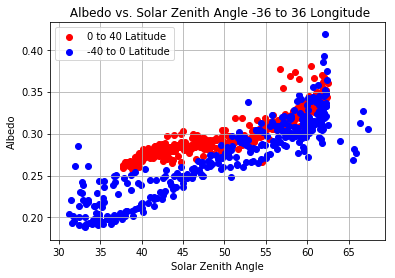

In [86]:
plt.scatter(CloudyStatsM29NC[3],CloudyStatsM29NC[0], color = 'r', label = '0 to 40 Latitude' )
plt.scatter(CloudyStatsM30NC[3],CloudyStatsM30NC[0], color = 'r')
plt.scatter(CloudyStatsM31NC[3],CloudyStatsM31NC[0], color = 'r')
plt.scatter(CloudyStatsM32NC[3],CloudyStatsM32NC[0], color = 'r')
plt.scatter(CloudyStatsM33NC[3],CloudyStatsM33NC[0], color = 'r')
plt.scatter(CloudyStatsM29SC[3],CloudyStatsM29SC[0], color = 'b', label = '-40 to 0 Latitude')
plt.scatter(CloudyStatsM30SC[3],CloudyStatsM30SC[0], color = 'b')
plt.scatter(CloudyStatsM31SC[3],CloudyStatsM31SC[0], color = 'b')
plt.scatter(CloudyStatsM32SC[3],CloudyStatsM32SC[0], color = 'b')
plt.scatter(CloudyStatsM33SC[3],CloudyStatsM33SC[0], color = 'b')
plt.legend()
plt.title(' Albedo vs. Solar Zenith Angle -36 to 36 Longitude')
plt.xlabel('Solar Zenith Angle')
plt.ylabel('Albedo')
plt.grid()
plt.show()

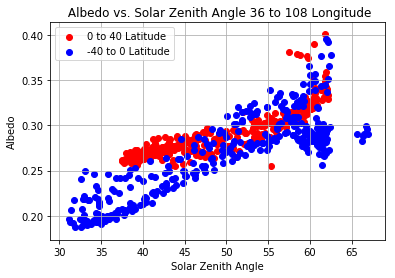

In [87]:
plt.scatter(CloudyStatsM29ND[3],CloudyStatsM29ND[0], color = 'r', label = '0 to 40 Latitude' )
plt.scatter(CloudyStatsM30ND[3],CloudyStatsM30ND[0], color = 'r')
plt.scatter(CloudyStatsM31ND[3],CloudyStatsM31ND[0], color = 'r')
plt.scatter(CloudyStatsM32ND[3],CloudyStatsM32ND[0], color = 'r')
plt.scatter(CloudyStatsM33ND[3],CloudyStatsM33ND[0], color = 'r')
plt.scatter(CloudyStatsM29SD[3],CloudyStatsM29SD[0], color = 'b', label = '-40 to 0 Latitude')
plt.scatter(CloudyStatsM30SD[3],CloudyStatsM30SD[0], color = 'b')
plt.scatter(CloudyStatsM31SD[3],CloudyStatsM31SD[0], color = 'b')
plt.scatter(CloudyStatsM32SD[3],CloudyStatsM32SD[0], color = 'b')
plt.scatter(CloudyStatsM33SD[3],CloudyStatsM33SD[0], color = 'b')
plt.legend()
plt.title(' Albedo vs. Solar Zenith Angle 36 to 108 Longitude')
plt.xlabel('Solar Zenith Angle')
plt.ylabel('Albedo')
plt.grid()
plt.show()

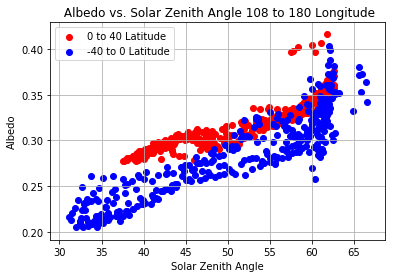

In [88]:
plt.scatter(CloudyStatsM29NE[3],CloudyStatsM29NE[0], color = 'r', label = '0 to 40 Latitude' )
plt.scatter(CloudyStatsM30NE[3],CloudyStatsM30NE[0], color = 'r')
plt.scatter(CloudyStatsM31NE[3],CloudyStatsM31NE[0], color = 'r')
plt.scatter(CloudyStatsM32NE[3],CloudyStatsM32NE[0], color = 'r')
plt.scatter(CloudyStatsM33NE[3],CloudyStatsM33NE[0], color = 'r')
plt.scatter(CloudyStatsM29SE[3],CloudyStatsM29SE[0], color = 'b', label = '-40 to 0 Latitude')
plt.scatter(CloudyStatsM30SE[3],CloudyStatsM30SE[0], color = 'b')
plt.scatter(CloudyStatsM31SE[3],CloudyStatsM31SE[0], color = 'b')
plt.scatter(CloudyStatsM32SE[3],CloudyStatsM32SE[0], color = 'b')
plt.scatter(CloudyStatsM33SE[3],CloudyStatsM33SE[0], color = 'b')
plt.legend()
plt.title(' Albedo vs. Solar Zenith Angle 108 to 180 Longitude')
plt.xlabel('Solar Zenith Angle')
plt.ylabel('Albedo')
plt.grid()
plt.show()

In [89]:
CloudyAlbSouthA = [CloudyStatsM29SA[0], CloudyStatsM30SA[0], CloudyStatsM31SA[0], CloudyStatsM32SA[0],
                     CloudyStatsM33SA[0]]
CloudyAlbSouthA = np.array(CloudyAlbSouthA)
CloudySZASouthA = [CloudyStatsM29SA[3], CloudyStatsM30SA[3], CloudyStatsM31SA[3], CloudyStatsM32SA[3],
                     CloudyStatsM33SA[3]]
CloudySZASouthA = np.array(CloudySZASouthA)

CloudyAlbNorthA = [CloudyStatsM29NA[0], CloudyStatsM30NA[0], CloudyStatsM31NA[0], CloudyStatsM32NA[0],
                   CloudyStatsM33NA[0]]
CloudyAlbNorthA = np.array(CloudyAlbNorthA)
CloudySZANorthA = [CloudyStatsM29NA[3], CloudyStatsM30NA[3], CloudyStatsM31NA[3], CloudyStatsM32NA[3],
                     CloudyStatsM33NA[3]]
CloudySZANorthA = np.array(CloudySZANorthA)


CloudyAlbSouthB = [CloudyStatsM29SB[0], CloudyStatsM30SB[0], CloudyStatsM31SB[0], CloudyStatsM32SB[0],
                     CloudyStatsM33SB[0]]
CloudyAlbSouthB = np.array(CloudyAlbSouthB)
CloudySZASouthB = [CloudyStatsM29SB[3], CloudyStatsM30SB[3], CloudyStatsM31SB[3], CloudyStatsM32SB[3],
                  CloudyStatsM33SB[3]]
CloudySZASouthB = np.array(CloudySZASouthB)

CloudyAlbNorthB = [CloudyStatsM29NB[0], CloudyStatsM30NB[0], CloudyStatsM31NB[0], CloudyStatsM32NB[0],
                     CloudyStatsM33NB[0]]
CloudyAlbNorthB = np.array(CloudyAlbNorthB)
CloudySZANorthB = [CloudyStatsM29NB[3], CloudyStatsM30NB[3], CloudyStatsM31NB[3], CloudyStatsM32NB[3],
                     CloudyStatsM33NB[3]]
CloudySZANorthB = np.array(CloudySZANorthB)


CloudyAlbSouthC = [CloudyStatsM29SC[0], CloudyStatsM30SC[0], CloudyStatsM31SC[0], CloudyStatsM32SC[0],
                     CloudyStatsM33SC[0]]
CloudyAlbSouthC = np.array(CloudyAlbSouthC)
CloudySZASouthC = [CloudyStatsM29SC[3], CloudyStatsM30SC[3], CloudyStatsM31SC[3], CloudyStatsM32SC[3],
                  CloudyStatsM33SC[3]]
CloudySZASouthC = np.array(CloudySZASouthC)

CloudyAlbNorthC = [CloudyStatsM29NC[0], CloudyStatsM30NC[0], CloudyStatsM31NC[0], CloudyStatsM32NC[0],
                     CloudyStatsM33NC[0]]
CloudyAlbNorthC = np.array(CloudyAlbNorthC)
CloudySZANorthC = [CloudyStatsM29NC[3], CloudyStatsM30NC[3], CloudyStatsM31NC[3], CloudyStatsM32NC[3],
                     CloudyStatsM33NC[3]]
CloudySZANorthC = np.array(CloudySZANorthC)


CloudyAlbSouthD = [CloudyStatsM29SD[0], CloudyStatsM30SD[0], CloudyStatsM31SD[0], CloudyStatsM32SD[0],
                     CloudyStatsM33SD[0]]
CloudyAlbSouthD = np.array(CloudyAlbSouthD)
CloudySZASouthD = [CloudyStatsM29SD[3], CloudyStatsM30SD[3], CloudyStatsM31SD[3], CloudyStatsM32SD[3],
                  CloudyStatsM33SD[3]]
CloudySZASouthD = np.array(CloudySZASouthD)

CloudyAlbNorthD = [CloudyStatsM29ND[0], CloudyStatsM30ND[0], CloudyStatsM31ND[0], CloudyStatsM32ND[0],
                     CloudyStatsM33ND[0]]
CloudyAlbNorthD = np.array(CloudyAlbNorthD)
CloudySZANorthD = [CloudyStatsM29ND[3], CloudyStatsM30ND[3], CloudyStatsM31ND[3], CloudyStatsM32ND[3],
                     CloudyStatsM33ND[3]]
CloudySZANorthD = np.array(CloudySZANorthD)


CloudyAlbSouthE = [CloudyStatsM29SE[0], CloudyStatsM30SE[0], CloudyStatsM31SE[0], CloudyStatsM32SE[0],
                     CloudyStatsM33SE[0]]
CloudyAlbSouthE = np.array(CloudyAlbSouthE)
CloudySZASouthE = [CloudyStatsM29SE[3], CloudyStatsM30SE[3], CloudyStatsM31SE[3], CloudyStatsM32SE[3],
                  CloudyStatsM33SE[3]]
CloudySZASouthE = np.array(CloudySZASouthE)

CloudyAlbNorthE = [CloudyStatsM29NE[0], CloudyStatsM30NE[0], CloudyStatsM31NE[0], CloudyStatsM32NE[0],
                     CloudyStatsM33NE[0]]
CloudyAlbNorthE = np.array(CloudyAlbNorthE)
CloudySZANorthE = [CloudyStatsM29NE[3], CloudyStatsM30NE[3], CloudyStatsM31NE[3], CloudyStatsM32NE[3],
                     CloudyStatsM33NE[3]]
CloudySZANorthE = np.array(CloudySZANorthE)

In [90]:
CloudyAlbNorthAFit = CloudyAlbNorthA[np.logical_not(np.isnan(CloudyAlbNorthA))]
CloudySZANorthAFit = CloudySZANorthA[np.logical_not(np.isnan(CloudySZANorthA))]              
CloudyAlbNorthBFit = CloudyAlbNorthB[np.logical_not(np.isnan(CloudyAlbNorthB))]
CloudySZANorthBFit = CloudySZANorthB[np.logical_not(np.isnan(CloudySZANorthB))]
CloudyAlbNorthCFit = CloudyAlbNorthC[np.logical_not(np.isnan(CloudyAlbNorthC))]
CloudySZANorthCFit = CloudySZANorthC[np.logical_not(np.isnan(CloudySZANorthC))]
CloudyAlbNorthDFit = CloudyAlbNorthD[np.logical_not(np.isnan(CloudyAlbNorthD))]
CloudySZANorthDFit = CloudySZANorthD[np.logical_not(np.isnan(CloudySZANorthD))]
CloudyAlbNorthEFit = CloudyAlbNorthE[np.logical_not(np.isnan(CloudyAlbNorthE))]
CloudySZANorthEFit = CloudySZANorthE[np.logical_not(np.isnan(CloudySZANorthE))]

In [91]:
CloudyAlbSouthAFit = CloudyAlbSouthA[np.logical_not(np.isnan(CloudyAlbSouthA))]
CloudySZASouthAFit = CloudySZASouthA[np.logical_not(np.isnan(CloudySZASouthA))]              
CloudyAlbSouthBFit = CloudyAlbSouthB[np.logical_not(np.isnan(CloudyAlbSouthB))]
CloudySZASouthBFit = CloudySZASouthB[np.logical_not(np.isnan(CloudySZASouthB))]
CloudyAlbSouthCFit = CloudyAlbSouthC[np.logical_not(np.isnan(CloudyAlbSouthC))]
CloudySZASouthCFit = CloudySZASouthC[np.logical_not(np.isnan(CloudySZASouthC))]
CloudyAlbSouthDFit = CloudyAlbSouthD[np.logical_not(np.isnan(CloudyAlbSouthD))]
CloudySZASouthDFit = CloudySZASouthD[np.logical_not(np.isnan(CloudySZASouthD))]
CloudyAlbSouthEFit = CloudyAlbSouthE[np.logical_not(np.isnan(CloudyAlbSouthE))]
CloudySZASouthEFit = CloudySZASouthE[np.logical_not(np.isnan(CloudySZASouthE))]

In [92]:
CloudyAlbSouthAFit[(CloudySZASouthAFit > 60.0)] = CloudyAlbSouthAFit[(CloudySZASouthAFit > 60.0)]
CloudyAlbSouthBFit[(CloudySZASouthBFit > 60.0)] = CloudyAlbSouthBFit[(CloudySZASouthBFit > 60.0)]
CloudyAlbSouthCFit[(CloudySZASouthCFit > 60.0)] = CloudyAlbSouthCFit[(CloudySZASouthCFit > 60.0)]
CloudyAlbSouthDFit[(CloudySZASouthDFit > 60.0)] = CloudyAlbSouthDFit[(CloudySZASouthDFit > 60.0)]
CloudyAlbSouthEFit[(CloudySZASouthEFit > 60.0)] = CloudyAlbSouthEFit[(CloudySZASouthEFit > 60.0)]

In [93]:
CloudyAlbNorthAFit[(CloudySZANorthAFit > 60.0)] = CloudyAlbNorthAFit[(CloudySZANorthAFit > 60.0)]
CloudyAlbNorthBFit[(CloudySZANorthBFit > 60.0)] = CloudyAlbNorthBFit[(CloudySZANorthBFit > 60.0)]
CloudyAlbNorthCFit[(CloudySZANorthCFit > 60.0)] = CloudyAlbNorthCFit[(CloudySZANorthCFit > 60.0)]
CloudyAlbNorthDFit[(CloudySZANorthDFit > 60.0)] = CloudyAlbNorthDFit[(CloudySZANorthDFit > 60.0)]
CloudyAlbNorthEFit[(CloudySZANorthEFit > 60.0)] = CloudyAlbNorthEFit[(CloudySZANorthEFit > 60.0)]

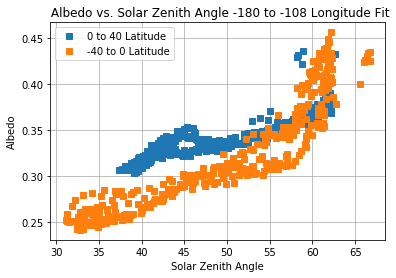

In [94]:
plt.plot(CloudySZANorthAFit, CloudyAlbNorthAFit, 's', label = '0 to 40 Latitude')
plt.plot(CloudySZASouthAFit, CloudyAlbSouthAFit, 's', label = '-40 to 0 Latitude')
plt.title(' Albedo vs. Solar Zenith Angle -180 to -108 Longitude Fit')
plt.xlabel('Solar Zenith Angle')
plt.ylabel('Albedo')
plt.grid()
plt.legend()
plt.show()

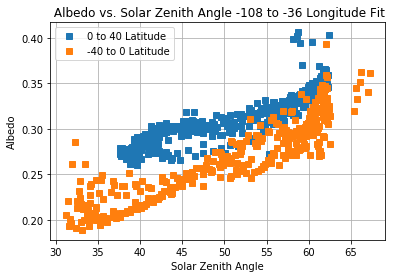

In [95]:
plt.plot(CloudySZANorthBFit, CloudyAlbNorthBFit, 's', label = '0 to 40 Latitude')
plt.plot(CloudySZASouthBFit, CloudyAlbSouthBFit, 's', label = '-40 to 0 Latitude')
plt.title(' Albedo vs. Solar Zenith Angle -108 to -36 Longitude Fit')
plt.xlabel('Solar Zenith Angle')
plt.ylabel('Albedo')
plt.grid()
plt.legend()
plt.show()

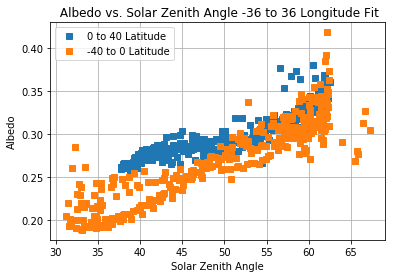

In [96]:
plt.plot(CloudySZANorthCFit, CloudyAlbNorthCFit, 's', label = '0 to 40 Latitude')
plt.plot(CloudySZASouthCFit, CloudyAlbSouthCFit, 's', label = '-40 to 0 Latitude')
plt.title(' Albedo vs. Solar Zenith Angle -36 to 36 Longitude Fit')
plt.xlabel('Solar Zenith Angle')
plt.ylabel('Albedo')
plt.grid()
plt.legend()
plt.show()

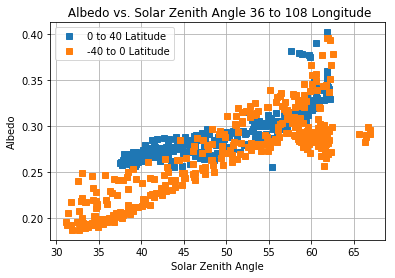

In [97]:
plt.plot(CloudySZANorthDFit, CloudyAlbNorthDFit, 's', label = '0 to 40 Latitude')
plt.plot(CloudySZASouthDFit, CloudyAlbSouthDFit, 's', label = '-40 to 0 Latitude')
plt.title(' Albedo vs. Solar Zenith Angle 36 to 108 Longitude')
plt.xlabel('Solar Zenith Angle')
plt.ylabel('Albedo')
plt.grid()
plt.legend()
plt.show()

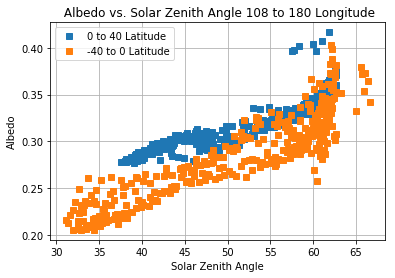

In [98]:
plt.plot(CloudySZANorthEFit, CloudyAlbNorthEFit, 's', label = '0 to 40 Latitude')
plt.plot(CloudySZASouthEFit, CloudyAlbSouthEFit, 's', label = '-40 to 0 Latitude')
plt.title(' Albedo vs. Solar Zenith Angle 108 to 180 Longitude')
plt.xlabel('Solar Zenith Angle')
plt.ylabel('Albedo')
plt.grid()
plt.legend()
plt.show()

In [99]:
psA = np.polyfit(CloudySZASouthAFit[(CloudySZASouthAFit<60.0)],CloudyAlbSouthAFit[(CloudySZASouthAFit<60.0)], 1)
psB = np.polyfit(CloudySZASouthBFit[(CloudySZASouthBFit<60.0)],CloudyAlbSouthBFit[(CloudySZASouthBFit<60.0)], 1)
psC = np.polyfit(CloudySZASouthCFit[(CloudySZASouthCFit<60.0)],CloudyAlbSouthCFit[(CloudySZASouthCFit<60.0)], 1)
psD = np.polyfit(CloudySZASouthDFit[(CloudySZASouthDFit<60.0)],CloudyAlbSouthDFit[(CloudySZASouthDFit<60.0)], 1)
psE = np.polyfit(CloudySZASouthEFit[(CloudySZASouthEFit<60.0)],CloudyAlbSouthEFit[(CloudySZASouthEFit<60.0)], 1)

In [100]:
pnA = np.polyfit(CloudySZANorthAFit[(CloudySZANorthAFit<60.0)],CloudyAlbNorthAFit[(CloudySZANorthAFit<60.0)], 1)
pnB = np.polyfit(CloudySZANorthBFit[(CloudySZANorthBFit<60.0)],CloudyAlbNorthBFit[(CloudySZANorthBFit<60.0)], 1)
pnC = np.polyfit(CloudySZANorthCFit[(CloudySZANorthCFit<60.0)],CloudyAlbNorthCFit[(CloudySZANorthCFit<60.0)], 1)
pnD = np.polyfit(CloudySZANorthDFit[(CloudySZANorthDFit<60.0)],CloudyAlbNorthDFit[(CloudySZANorthDFit<60.0)], 1)
pnE = np.polyfit(CloudySZANorthEFit[(CloudySZANorthEFit<60.0)],CloudyAlbNorthEFit[(CloudySZANorthEFit<60.0)], 1)

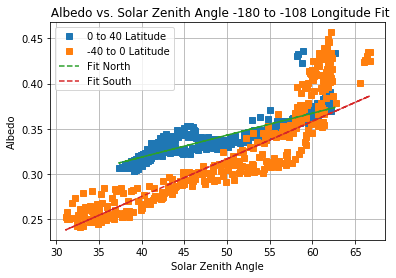

In [101]:
plt.plot(CloudySZANorthAFit, CloudyAlbNorthAFit, 's', label = '0 to 40 Latitude')
plt.plot(CloudySZASouthAFit, CloudyAlbSouthAFit, 's', label = '-40 to 0 Latitude')
plt.plot(CloudySZANorthAFit, np.polyval(pnA, CloudySZANorthAFit), '--', label = 'Fit North')
plt.plot(CloudySZASouthAFit, np.polyval(psA, CloudySZASouthAFit), '--', label = 'Fit South')
plt.title(' Albedo vs. Solar Zenith Angle -180 to -108 Longitude Fit')
plt.xlabel('Solar Zenith Angle')
plt.ylabel('Albedo')
plt.grid()
plt.legend()
plt.show()

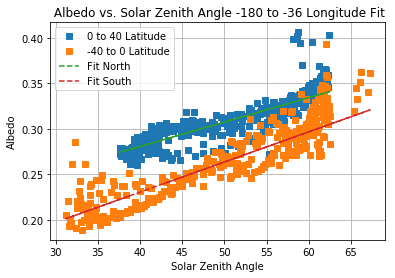

In [102]:
plt.plot(CloudySZANorthBFit, CloudyAlbNorthBFit, 's', label = '0 to 40 Latitude')
plt.plot(CloudySZASouthBFit, CloudyAlbSouthBFit, 's', label = '-40 to 0 Latitude')
plt.plot(CloudySZANorthBFit, np.polyval(pnB, CloudySZANorthBFit), '--', label = 'Fit North')
plt.plot(CloudySZASouthBFit, np.polyval(psB, CloudySZASouthBFit), '--', label = 'Fit South')
plt.title(' Albedo vs. Solar Zenith Angle -180 to -36 Longitude Fit')
plt.xlabel('Solar Zenith Angle')
plt.ylabel('Albedo')
plt.grid()
plt.legend()
plt.show()

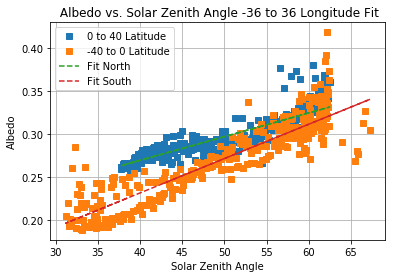

In [103]:
plt.plot(CloudySZANorthCFit, CloudyAlbNorthCFit, 's', label = '0 to 40 Latitude')
plt.plot(CloudySZASouthCFit, CloudyAlbSouthCFit, 's', label = '-40 to 0 Latitude')
plt.plot(CloudySZANorthCFit, np.polyval(pnC, CloudySZANorthCFit), '--', label = 'Fit North')
plt.plot(CloudySZASouthCFit, np.polyval(psC, CloudySZASouthCFit), '--', label = 'Fit South')
plt.title(' Albedo vs. Solar Zenith Angle -36 to 36 Longitude Fit')
plt.xlabel('Solar Zenith Angle')
plt.ylabel('Albedo')
plt.grid()
plt.legend()
plt.show()

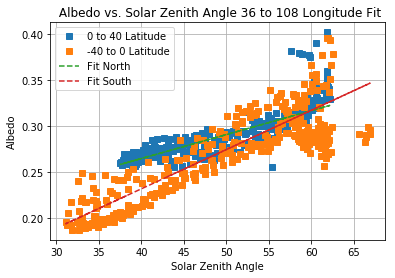

In [104]:
plt.plot(CloudySZANorthDFit, CloudyAlbNorthDFit, 's', label = '0 to 40 Latitude')
plt.plot(CloudySZASouthDFit, CloudyAlbSouthDFit, 's', label = '-40 to 0 Latitude')
plt.plot(CloudySZANorthDFit, np.polyval(pnD, CloudySZANorthDFit), '--', label = 'Fit North')
plt.plot(CloudySZASouthDFit, np.polyval(psD, CloudySZASouthDFit), '--', label = 'Fit South')
plt.title(' Albedo vs. Solar Zenith Angle 36 to 108 Longitude Fit')
plt.xlabel('Solar Zenith Angle')
plt.ylabel('Albedo')
plt.grid()
plt.legend()
plt.show()

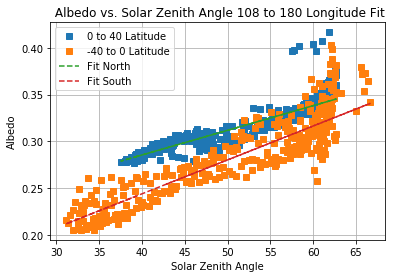

In [105]:
plt.plot(CloudySZANorthEFit, CloudyAlbNorthEFit, 's', label = '0 to 40 Latitude')
plt.plot(CloudySZASouthEFit, CloudyAlbSouthEFit, 's', label = '-40 to 0 Latitude')
plt.plot(CloudySZANorthEFit, np.polyval(pnE, CloudySZANorthEFit), '--', label = 'Fit North')
plt.plot(CloudySZASouthEFit, np.polyval(psE, CloudySZASouthEFit), '--', label = 'Fit South')
plt.title(' Albedo vs. Solar Zenith Angle 108 to 180 Longitude Fit')
plt.xlabel('Solar Zenith Angle')
plt.ylabel('Albedo')
plt.grid()
plt.legend()
plt.show()

In [106]:
CloudyAlbSouthAPrimeFit = CloudyAlbSouthAFit/np.polyval(psA, CloudySZASouthAFit)*np.mean(CloudyAlbSouthAFit)
CloudyAlbSouthBPrimeFit = CloudyAlbSouthBFit/np.polyval(psB, CloudySZASouthBFit)*np.mean(CloudyAlbSouthBFit)
CloudyAlbSouthCPrimeFit = CloudyAlbSouthCFit/np.polyval(psC, CloudySZASouthCFit)*np.mean(CloudyAlbSouthCFit)
CloudyAlbSouthDPrimeFit = CloudyAlbSouthDFit/np.polyval(psD, CloudySZASouthDFit)*np.mean(CloudyAlbSouthDFit)
CloudyAlbSouthEPrimeFit = CloudyAlbSouthEFit/np.polyval(psE, CloudySZASouthEFit)*np.mean(CloudyAlbSouthEFit)

In [107]:
CloudyAlbNorthAPrimeFit = CloudyAlbNorthAFit/np.polyval(pnA, CloudySZANorthAFit)*np.mean(CloudyAlbNorthAFit)
CloudyAlbNorthBPrimeFit = CloudyAlbNorthBFit/np.polyval(pnB, CloudySZANorthBFit)*np.mean(CloudyAlbNorthBFit)
CloudyAlbNorthCPrimeFit = CloudyAlbNorthCFit/np.polyval(pnC, CloudySZANorthCFit)*np.mean(CloudyAlbNorthCFit)
CloudyAlbNorthDPrimeFit = CloudyAlbNorthDFit/np.polyval(pnD, CloudySZANorthDFit)*np.mean(CloudyAlbNorthDFit)
CloudyAlbNorthEPrimeFit = CloudyAlbNorthEFit/np.polyval(pnE, CloudySZANorthEFit)*np.mean(CloudyAlbNorthEFit)

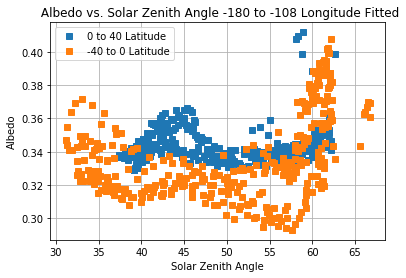

In [108]:
plt.plot(CloudySZANorthAFit,CloudyAlbNorthAPrimeFit, 's', label = '0 to 40 Latitude')
plt.plot(CloudySZASouthAFit,CloudyAlbSouthAPrimeFit, 's', label = '-40 to 0 Latitude')
plt.title(' Albedo vs. Solar Zenith Angle -180 to -108 Longitude Fitted')
plt.xlabel('Solar Zenith Angle')
plt.ylabel('Albedo')
plt.grid()
plt.legend()
plt.show()

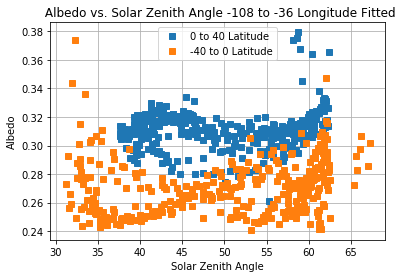

In [109]:
plt.plot(CloudySZANorthBFit,CloudyAlbNorthBPrimeFit, 's', label = '0 to 40 Latitude')
plt.plot(CloudySZASouthBFit,CloudyAlbSouthBPrimeFit, 's', label = '-40 to 0 Latitude')
plt.title(' Albedo vs. Solar Zenith Angle -108 to -36 Longitude Fitted')
plt.xlabel('Solar Zenith Angle')
plt.ylabel('Albedo')
plt.grid()
plt.legend()
plt.show()

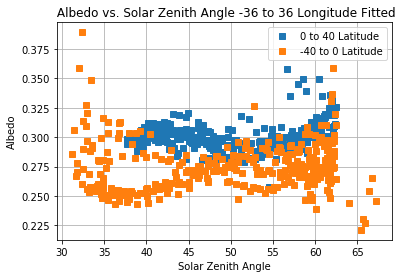

In [110]:
plt.plot(CloudySZANorthCFit,CloudyAlbNorthCPrimeFit, 's', label = '0 to 40 Latitude')
plt.plot(CloudySZASouthCFit,CloudyAlbSouthCPrimeFit, 's', label = '-40 to 0 Latitude')
plt.title(' Albedo vs. Solar Zenith Angle -36 to 36 Longitude Fitted')
plt.xlabel('Solar Zenith Angle')
plt.ylabel('Albedo')
plt.grid()
plt.legend()
plt.show()

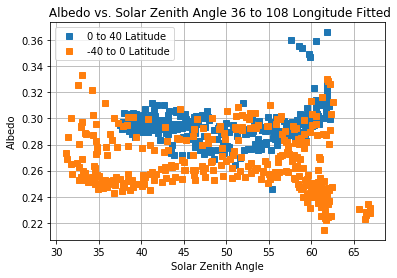

In [111]:
plt.plot(CloudySZANorthDFit,CloudyAlbNorthDPrimeFit, 's', label = '0 to 40 Latitude')
plt.plot(CloudySZASouthDFit,CloudyAlbSouthDPrimeFit, 's', label = '-40 to 0 Latitude')
plt.title(' Albedo vs. Solar Zenith Angle 36 to 108 Longitude Fitted')
plt.xlabel('Solar Zenith Angle')
plt.ylabel('Albedo')
plt.grid()
plt.legend()
plt.show()

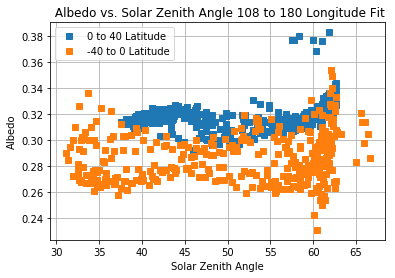

In [112]:
plt.plot(CloudySZANorthEFit,CloudyAlbNorthEPrimeFit, 's', label = '0 to 40 Latitude')
plt.plot(CloudySZASouthEFit,CloudyAlbSouthEPrimeFit, 's', label = '-40 to 0 Latitude')
plt.title(' Albedo vs. Solar Zenith Angle 108 to 180 Longitude Fit')
plt.xlabel('Solar Zenith Angle')
plt.ylabel('Albedo')
plt.grid()
plt.legend()
plt.show()

In [113]:
CloudyAlbSouthAPrime = CloudyAlbSouthA/polyval_NaN(psA, CloudySZASouthA)*np.nanmean(CloudyAlbSouthA)
CloudyAlbSouthBPrime = CloudyAlbSouthB/polyval_NaN(psB, CloudySZASouthB)*np.nanmean(CloudyAlbSouthB)
CloudyAlbSouthCPrime = CloudyAlbSouthC/polyval_NaN(psC, CloudySZASouthC)*np.nanmean(CloudyAlbSouthC)
CloudyAlbSouthDPrime = CloudyAlbSouthD/polyval_NaN(psD, CloudySZASouthD)*np.nanmean(CloudyAlbSouthD)
CloudyAlbSouthEPrime = CloudyAlbSouthE/polyval_NaN(psE, CloudySZASouthE)*np.nanmean(CloudyAlbSouthE)

In [114]:
CloudyAlbNorthAPrime = CloudyAlbNorthA/polyval_NaN(pnA, CloudySZANorthA)*np.nanmean(CloudyAlbNorthA)
CloudyAlbNorthBPrime = CloudyAlbNorthB/polyval_NaN(pnB, CloudySZANorthB)*np.nanmean(CloudyAlbNorthB)
CloudyAlbNorthCPrime = CloudyAlbNorthC/polyval_NaN(pnC, CloudySZANorthC)*np.nanmean(CloudyAlbNorthC)
CloudyAlbNorthDPrime = CloudyAlbNorthD/polyval_NaN(pnD, CloudySZANorthD)*np.nanmean(CloudyAlbNorthD)
CloudyAlbNorthEPrime = CloudyAlbNorthE/polyval_NaN(pnE, CloudySZANorthE)*np.nanmean(CloudyAlbNorthE)

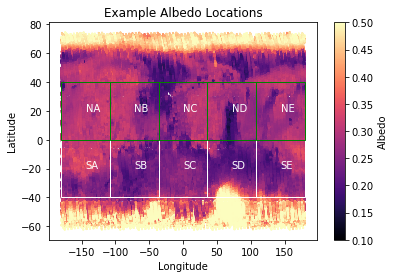

In [115]:
fig= plt.figure(2)
ax = fig.add_subplot(1,1,1)
img  = ax.scatter(Alb29[1][0], Alb29[0][0],c=Alb29[2][0], cmap='magma', s=0.5,vmax =0.5, vmin = 0.1)
rect = patches.Rectangle((-180,-40),72,40,linewidth=1,edgecolor='w',facecolor='none', label = 'NA')
rect2 = patches.Rectangle((-180,0),72,40,linewidth=1,edgecolor='g',facecolor='none')
rect3 = patches.Rectangle((-108,-40),72,40,linewidth=1,edgecolor='w',facecolor='none')
rect4 = patches.Rectangle((-108,0),72,40,linewidth=1,edgecolor='g',facecolor='none')
rect5 = patches.Rectangle((-36,-40),72,40,linewidth=1,edgecolor='w',facecolor='none')
rect6 = patches.Rectangle((-36,0),72,40,linewidth=1,edgecolor='g',facecolor='none')
rect7 = patches.Rectangle((36,-40),72,40,linewidth=1,edgecolor='w',facecolor='none')
rect8 = patches.Rectangle((36,0),72,40,linewidth=1,edgecolor='g',facecolor='none')
rect9 = patches.Rectangle((108,-40),72,40,linewidth=1,edgecolor='w',facecolor='none')
rect10 = patches.Rectangle((108,0),72,40,linewidth=1,edgecolor='g',facecolor='none')
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('Example Albedo Locations')
ax.add_patch(rect)
ax.add_patch(rect2)
ax.add_patch(rect3)
ax.add_patch(rect4)
ax.add_patch(rect5)
ax.add_patch(rect6)
ax.add_patch(rect7)
ax.add_patch(rect8)
ax.add_patch(rect9)
ax.add_patch(rect10)
ax.text(-144, 20, 'NA', color='w', bbox=dict(facecolor='none', edgecolor='none'))
ax.text(-144, -20, 'SA', color='w', bbox=dict(facecolor='none', edgecolor='none'))
ax.text(-72, 20, 'NB', color='w', bbox=dict(facecolor='none', edgecolor='none'))
ax.text(-72, -20, 'SB', color='w', bbox=dict(facecolor='none', edgecolor='none'))
ax.text(0, 20, 'NC', color='w', bbox=dict(facecolor='none', edgecolor='none'))
ax.text(0, -20, 'SC', color='w', bbox=dict(facecolor='none', edgecolor='none'))
ax.text(72, 20, 'ND', color='w', bbox=dict(facecolor='none', edgecolor='none'))
ax.text(72, -20, 'SD', color='w', bbox=dict(facecolor='none', edgecolor='none'))
ax.text(144, 20, 'NE', color='w', bbox=dict(facecolor='none', edgecolor='none'))
ax.text(144, -20, 'SE', color='w', bbox=dict(facecolor='none', edgecolor='none'))
cbar = fig.colorbar(img, label = 'Albedo')
plt.show()

In [116]:
NAQUAD = np.vstack((CloudyAlbNorthAPrime[0], CloudyAlbNorthAPrime[1],CloudyAlbNorthAPrime[2],
                   CloudyAlbNorthAPrime[3], CloudyAlbNorthAPrime[4]))
NAmedian = [np.nanmedian(NAQUAD[:,0]),np.nanmedian(NAQUAD[:,1]),np.nanmedian(NAQUAD[:,2]),np.nanmedian(NAQUAD[:,3]),np.nanmedian(NAQUAD[:,4]),
            np.nanmedian(NAQUAD[:,5]),np.nanmedian(NAQUAD[:,6]),np.nanmedian(NAQUAD[:,7]),np.nanmedian(NAQUAD[:,8]),
            np.nanmedian(NAQUAD[:,9]),np.nanmedian(NAQUAD[:,10]),np.nanmedian(NAQUAD[:,11]),np.nanmedian(NAQUAD[:,12]),
            np.nanmedian(NAQUAD[:,13]),np.nanmedian(NAQUAD[:,14]),np.nanmedian(NAQUAD[:,15]),np.nanmedian(NAQUAD[:,16]),
            np.nanmedian(NAQUAD[:,17]),np.nanmedian(NAQUAD[:,18]),np.nanmedian(NAQUAD[:,19]),np.nanmedian(NAQUAD[:,20]),
            np.nanmedian(NAQUAD[:,21]),np.nanmedian(NAQUAD[:,22]),np.nanmedian(NAQUAD[:,23]),np.nanmedian(NAQUAD[:,24]),
            np.nanmedian(NAQUAD[:,25]),np.nanmedian(NAQUAD[:,26]),np.nanmedian(NAQUAD[:,27]),np.nanmedian(NAQUAD[:,28]),
            np.nanmedian(NAQUAD[:,29]),np.nanmedian(NAQUAD[:,30]),np.nanmedian(NAQUAD[:,31]),np.nanmedian(NAQUAD[:,32]),
            np.nanmedian(NAQUAD[:,33]),np.nanmedian(NAQUAD[:,34]),np.nanmedian(NAQUAD[:,35]),np.nanmedian(NAQUAD[:,36]),
            np.nanmedian(NAQUAD[:,37]),np.nanmedian(NAQUAD[:,38]),np.nanmedian(NAQUAD[:,39]),np.nanmedian(NAQUAD[:,40]),
            np.nanmedian(NAQUAD[:,41]),np.nanmedian(NAQUAD[:,42]),np.nanmedian(NAQUAD[:,43]),np.nanmedian(NAQUAD[:,44]),
            np.nanmedian(NAQUAD[:,45]),np.nanmedian(NAQUAD[:,46]),np.nanmedian(NAQUAD[:,47]),np.nanmedian(NAQUAD[:,48]),
            np.nanmedian(NAQUAD[:,49]),np.nanmedian(NAQUAD[:,50]),np.nanmedian(NAQUAD[:,51]),np.nanmedian(NAQUAD[:,52]),
            np.nanmedian(NAQUAD[:,53]),np.nanmedian(NAQUAD[:,54]),np.nanmedian(NAQUAD[:,55]),np.nanmedian(NAQUAD[:,56]),
            np.nanmedian(NAQUAD[:,57]),np.nanmedian(NAQUAD[:,58]),np.nanmedian(NAQUAD[:,59]),np.nanmedian(NAQUAD[:,60]),
            np.nanmedian(NAQUAD[:,61]),np.nanmedian(NAQUAD[:,62]),np.nanmedian(NAQUAD[:,63]),np.nanmedian(NAQUAD[:,64]),
            np.nanmedian(NAQUAD[:,65]),np.nanmedian(NAQUAD[:,66]),np.nanmedian(NAQUAD[:,67]),np.nanmedian(NAQUAD[:,68]),
            np.nanmedian(NAQUAD[:,69]),np.nanmedian(NAQUAD[:,70]),np.nanmedian(NAQUAD[:,71])]
NAmedian = np.array(NAmedian)
LS = np.linspace(0,360,72)

In [117]:
CloudyAlbNorthAMY29MED = CloudyAlbNorthAPrime[0] - NAmedian
CloudyAlbNorthAMY30MED = CloudyAlbNorthAPrime[1] - NAmedian
CloudyAlbNorthAMY31MED = CloudyAlbNorthAPrime[2] - NAmedian
CloudyAlbNorthAMY32MED = CloudyAlbNorthAPrime[3] - NAmedian
CloudyAlbNorthAMY33MED = CloudyAlbNorthAPrime[4] - NAmedian

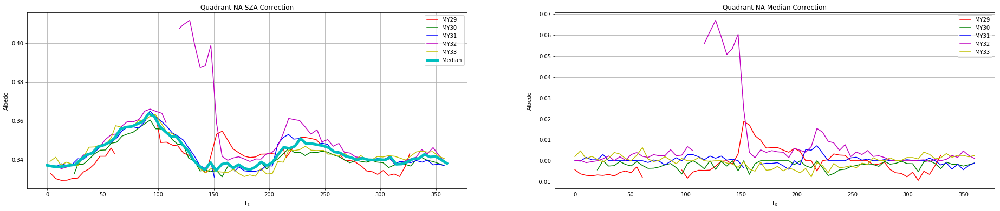

In [118]:
fig, axes = plt.subplots(1,2, sharex = True, sharey = False, figsize= (32,6))
plt.sca(axes[0])
plt.plot(CloudyStatsM29NA[2],CloudyAlbNorthAPrime[0], color ='r',   label = 'MY29')
plt.plot(CloudyStatsM30NA[2],CloudyAlbNorthAPrime[1], color ='g',   label = 'MY30')
plt.plot(CloudyStatsM31NA[2],CloudyAlbNorthAPrime[2], color ='b',   label = 'MY31')
plt.plot(CloudyStatsM32NA[2],CloudyAlbNorthAPrime[3], color ='m',   label = 'MY32')
plt.plot(CloudyStatsM33NA[2],CloudyAlbNorthAPrime[4], color ='y',   label = 'MY33')
plt.plot(LS, NAmedian , color ='c', linewidth =5.0, label='Median')
plt.xlabel('$\mathregular{L_s}$')
plt.ylabel('Albedo')
plt.title('Quadrant NA SZA Correction')
plt.legend()
plt.grid()
plt.sca(axes[1])
plt.plot(LS,CloudyAlbNorthAMY29MED, color ='r',   label = 'MY29')
plt.plot(LS,CloudyAlbNorthAMY30MED, color ='g',   label = 'MY30')
plt.plot(LS,CloudyAlbNorthAMY31MED, color ='b',   label = 'MY31')
plt.plot(LS,CloudyAlbNorthAMY32MED, color ='m',   label = 'MY32')
plt.plot(LS,CloudyAlbNorthAMY33MED, color ='y',   label = 'MY33')
plt.xlabel('$\mathregular{L_s}$')
plt.ylabel('Albedo')
plt.title('Quadrant NA Median Correction')
plt.legend()
plt.grid()
plt.show()


In [119]:
SAQUAD = np.vstack((CloudyAlbSouthAPrime[0], CloudyAlbSouthAPrime[1],CloudyAlbSouthAPrime[2],
                   CloudyAlbSouthAPrime[3], CloudyAlbSouthAPrime[4]))
SAmedian = [np.nanmedian(SAQUAD[:,0]),np.nanmedian(SAQUAD[:,1]),np.nanmedian(SAQUAD[:,2]),np.nanmedian(SAQUAD[:,3]),
            np.nanmedian(SAQUAD[:,4]),
            np.nanmedian(SAQUAD[:,5]),np.nanmedian(SAQUAD[:,6]),np.nanmedian(SAQUAD[:,7]),np.nanmedian(SAQUAD[:,8]),
            np.nanmedian(SAQUAD[:,9]),np.nanmedian(SAQUAD[:,10]),np.nanmedian(SAQUAD[:,11]),np.nanmedian(SAQUAD[:,12]),
            np.nanmedian(SAQUAD[:,13]),np.nanmedian(SAQUAD[:,14]),np.nanmedian(SAQUAD[:,15]),np.nanmedian(SAQUAD[:,16]),
            np.nanmedian(SAQUAD[:,17]),np.nanmedian(SAQUAD[:,18]),np.nanmedian(SAQUAD[:,19]),np.nanmedian(SAQUAD[:,20]),
            np.nanmedian(SAQUAD[:,21]),np.nanmedian(SAQUAD[:,22]),np.nanmedian(SAQUAD[:,23]),np.nanmedian(SAQUAD[:,24]),
            np.nanmedian(SAQUAD[:,25]),np.nanmedian(SAQUAD[:,26]),np.nanmedian(SAQUAD[:,27]),np.nanmedian(SAQUAD[:,28]),
            np.nanmedian(SAQUAD[:,29]),np.nanmedian(SAQUAD[:,30]),np.nanmedian(SAQUAD[:,31]),np.nanmedian(SAQUAD[:,32]),
            np.nanmedian(SAQUAD[:,33]),np.nanmedian(SAQUAD[:,34]),np.nanmedian(SAQUAD[:,35]),np.nanmedian(SAQUAD[:,36]),
            np.nanmedian(SAQUAD[:,37]),np.nanmedian(SAQUAD[:,38]),np.nanmedian(SAQUAD[:,39]),np.nanmedian(SAQUAD[:,40]),
            np.nanmedian(SAQUAD[:,41]),np.nanmedian(SAQUAD[:,42]),np.nanmedian(SAQUAD[:,43]),np.nanmedian(SAQUAD[:,44]),
            np.nanmedian(SAQUAD[:,45]),np.nanmedian(SAQUAD[:,46]),np.nanmedian(SAQUAD[:,47]),np.nanmedian(SAQUAD[:,48]),
            np.nanmedian(SAQUAD[:,49]),np.nanmedian(SAQUAD[:,50]),np.nanmedian(SAQUAD[:,51]),np.nanmedian(SAQUAD[:,52]),
            np.nanmedian(SAQUAD[:,53]),np.nanmedian(SAQUAD[:,54]),np.nanmedian(SAQUAD[:,55]),np.nanmedian(SAQUAD[:,56]),
            np.nanmedian(SAQUAD[:,57]),np.nanmedian(SAQUAD[:,58]),np.nanmedian(SAQUAD[:,59]),np.nanmedian(SAQUAD[:,60]),
            np.nanmedian(SAQUAD[:,61]),np.nanmedian(SAQUAD[:,62]),np.nanmedian(SAQUAD[:,63]),np.nanmedian(SAQUAD[:,64]),
            np.nanmedian(SAQUAD[:,65]),np.nanmedian(SAQUAD[:,66]),np.nanmedian(SAQUAD[:,67]),np.nanmedian(SAQUAD[:,68]),
            np.nanmedian(SAQUAD[:,69]),np.nanmedian(SAQUAD[:,70]),np.nanmedian(SAQUAD[:,71])]
SAmedian = np.array(SAmedian)

In [120]:
CloudyAlbSouthAMY29MED = CloudyAlbSouthAPrime[0] - SAmedian
CloudyAlbSouthAMY30MED = CloudyAlbSouthAPrime[1] - SAmedian
CloudyAlbSouthAMY31MED = CloudyAlbSouthAPrime[2] - SAmedian
CloudyAlbSouthAMY32MED = CloudyAlbSouthAPrime[3] - SAmedian
CloudyAlbSouthAMY33MED = CloudyAlbSouthAPrime[4] - SAmedian

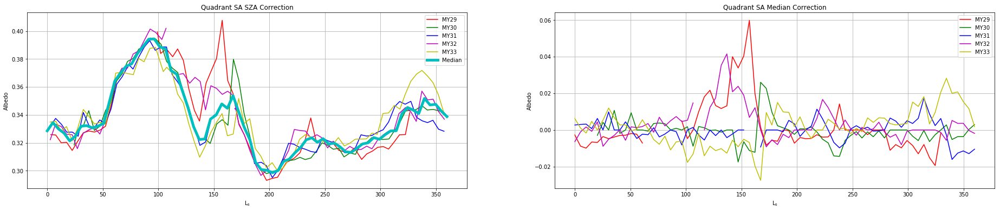

In [121]:
fig, axes = plt.subplots(1,2, sharex = True, sharey = False, figsize= (32,6))
plt.sca(axes[0])
plt.plot(CloudyStatsM29SA[2],CloudyAlbSouthAPrime[0], color ='r', label = 'MY29')
plt.plot(CloudyStatsM30SA[2],CloudyAlbSouthAPrime[1], color ='g', label = 'MY30')
plt.plot(CloudyStatsM31SA[2],CloudyAlbSouthAPrime[2], color ='b', label = 'MY31')
plt.plot(CloudyStatsM32SA[2],CloudyAlbSouthAPrime[3], color ='m', label = 'MY32')
plt.plot(CloudyStatsM33SA[2],CloudyAlbSouthAPrime[4], color ='y', label = 'MY33')
plt.plot(LS, SAmedian , color ='c', linewidth =5.0, label='Median')
plt.xlabel('$\mathregular{L_s}$')
plt.ylabel('Albedo')
plt.title('Quadrant SA SZA Correction')
plt.legend()
plt.grid()
plt.sca(axes[1])
plt.plot(LS,CloudyAlbSouthAMY29MED, color ='r',   label = 'MY29')
plt.plot(LS,CloudyAlbSouthAMY30MED, color ='g',   label = 'MY30')
plt.plot(LS,CloudyAlbSouthAMY31MED, color ='b',   label = 'MY31')
plt.plot(LS,CloudyAlbSouthAMY32MED, color ='m',   label = 'MY32')
plt.plot(LS,CloudyAlbSouthAMY33MED, color ='y',   label = 'MY33')
plt.xlabel('$\mathregular{L_s}$')
plt.ylabel('Albedo')
plt.title('Quadrant SA Median Correction')
plt.legend()
plt.grid()
plt.show()

In [122]:
NBQUAD = np.vstack((CloudyAlbNorthBPrime[0], CloudyAlbNorthBPrime[1],CloudyAlbNorthBPrime[2],
                   CloudyAlbNorthBPrime[3], CloudyAlbNorthBPrime[4]))
NBmedian = [np.nanmedian(NBQUAD[:,0]),np.nanmedian(NBQUAD[:,1]),np.nanmedian(NBQUAD[:,2]),np.nanmedian(NBQUAD[:,3]),np.nanmedian(NBQUAD[:,4]),
            np.nanmedian(NBQUAD[:,5]),np.nanmedian(NBQUAD[:,6]),np.nanmedian(NBQUAD[:,7]),np.nanmedian(NBQUAD[:,8]),
            np.nanmedian(NBQUAD[:,9]),np.nanmedian(NBQUAD[:,10]),np.nanmedian(NBQUAD[:,11]),np.nanmedian(NBQUAD[:,12]),
            np.nanmedian(NBQUAD[:,13]),np.nanmedian(NBQUAD[:,14]),np.nanmedian(NBQUAD[:,15]),np.nanmedian(NBQUAD[:,16]),
            np.nanmedian(NBQUAD[:,17]),np.nanmedian(NBQUAD[:,18]),np.nanmedian(NBQUAD[:,19]),np.nanmedian(NBQUAD[:,20]),
            np.nanmedian(NBQUAD[:,21]),np.nanmedian(NBQUAD[:,22]),np.nanmedian(NBQUAD[:,23]),np.nanmedian(NBQUAD[:,24]),
            np.nanmedian(NBQUAD[:,25]),np.nanmedian(NBQUAD[:,26]),np.nanmedian(NBQUAD[:,27]),np.nanmedian(NBQUAD[:,28]),
            np.nanmedian(NBQUAD[:,29]),np.nanmedian(NBQUAD[:,30]),np.nanmedian(NBQUAD[:,31]),np.nanmedian(NBQUAD[:,32]),
            np.nanmedian(NBQUAD[:,33]),np.nanmedian(NBQUAD[:,34]),np.nanmedian(NBQUAD[:,35]),np.nanmedian(NBQUAD[:,36]),
            np.nanmedian(NBQUAD[:,37]),np.nanmedian(NBQUAD[:,38]),np.nanmedian(NBQUAD[:,39]),np.nanmedian(NBQUAD[:,40]),
            np.nanmedian(NBQUAD[:,41]),np.nanmedian(NBQUAD[:,42]),np.nanmedian(NBQUAD[:,43]),np.nanmedian(NBQUAD[:,44]),
            np.nanmedian(NBQUAD[:,45]),np.nanmedian(NBQUAD[:,46]),np.nanmedian(NBQUAD[:,47]),np.nanmedian(NBQUAD[:,48]),
            np.nanmedian(NBQUAD[:,49]),np.nanmedian(NBQUAD[:,50]),np.nanmedian(NBQUAD[:,51]),np.nanmedian(NBQUAD[:,52]),
            np.nanmedian(NBQUAD[:,53]),np.nanmedian(NBQUAD[:,54]),np.nanmedian(NBQUAD[:,55]),np.nanmedian(NBQUAD[:,56]),
            np.nanmedian(NBQUAD[:,57]),np.nanmedian(NBQUAD[:,58]),np.nanmedian(NBQUAD[:,59]),np.nanmedian(NBQUAD[:,60]),
            np.nanmedian(NBQUAD[:,61]),np.nanmedian(NBQUAD[:,62]),np.nanmedian(NBQUAD[:,63]),np.nanmedian(NBQUAD[:,64]),
            np.nanmedian(NBQUAD[:,65]),np.nanmedian(NBQUAD[:,66]),np.nanmedian(NBQUAD[:,67]),np.nanmedian(NBQUAD[:,68]),
            np.nanmedian(NBQUAD[:,69]),np.nanmedian(NBQUAD[:,70]),np.nanmedian(NBQUAD[:,71])]
NBmedian = np.array(NBmedian)
LS = np.linspace(0,360,72)

In [123]:
CloudyAlbNorthBMY29MED = CloudyAlbNorthBPrime[0] - NBmedian
CloudyAlbNorthBMY30MED = CloudyAlbNorthBPrime[1] - NBmedian
CloudyAlbNorthBMY31MED = CloudyAlbNorthBPrime[2] - NBmedian
CloudyAlbNorthBMY32MED = CloudyAlbNorthBPrime[3] - NBmedian
CloudyAlbNorthBMY33MED = CloudyAlbNorthBPrime[4] - NBmedian

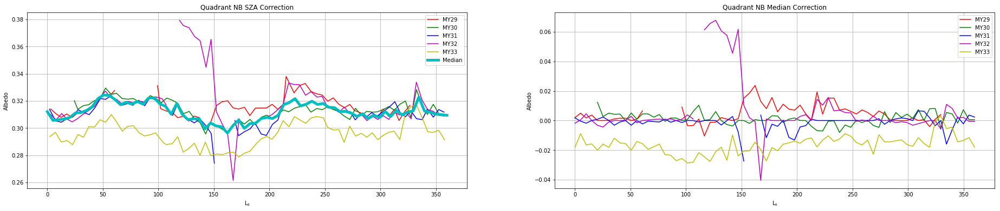

In [124]:
fig, axes = plt.subplots(1,2, sharex = True, sharey = False, figsize= (32,6))
plt.sca(axes[0])
plt.plot(CloudyStatsM29NB[2],CloudyAlbNorthBPrime[0], color ='r',   label = 'MY29')
plt.plot(CloudyStatsM30NB[2],CloudyAlbNorthBPrime[1], color ='g',   label = 'MY30')
plt.plot(CloudyStatsM31NB[2],CloudyAlbNorthBPrime[2], color ='b',   label = 'MY31')
plt.plot(CloudyStatsM32NB[2],CloudyAlbNorthBPrime[3], color ='m',   label = 'MY32')
plt.plot(CloudyStatsM33NB[2],CloudyAlbNorthBPrime[4], color ='y',   label = 'MY33')
plt.plot(LS, NBmedian , color ='c', linewidth =5.0, label='Median')
plt.xlabel('$\mathregular{L_s}$')
plt.ylabel('Albedo')
plt.title('Quadrant NB SZA Correction')
plt.legend()
plt.grid()
plt.sca(axes[1])
plt.plot(LS,CloudyAlbNorthBMY29MED, color ='r',   label = 'MY29')
plt.plot(LS,CloudyAlbNorthBMY30MED, color ='g',   label = 'MY30')
plt.plot(LS,CloudyAlbNorthBMY31MED, color ='b',   label = 'MY31')
plt.plot(LS,CloudyAlbNorthBMY32MED, color ='m',   label = 'MY32')
plt.plot(LS,CloudyAlbNorthBMY33MED, color ='y',   label = 'MY33')
plt.xlabel('$\mathregular{L_s}$')
plt.ylabel('Albedo')
plt.title('Quadrant NB Median Correction')
plt.legend()
plt.grid()
plt.show()


In [125]:
SBQUAD = np.vstack((CloudyAlbSouthBPrime[0], CloudyAlbSouthBPrime[1],CloudyAlbSouthBPrime[2],
                   CloudyAlbSouthBPrime[3], CloudyAlbSouthBPrime[4]))
SBmedian = [np.nanmedian(SBQUAD[:,0]),np.nanmedian(SBQUAD[:,1]),np.nanmedian(SBQUAD[:,2]),
            np.nanmedian(SBQUAD[:,3]), np.nanmedian(SBQUAD[:,4]),
            np.nanmedian(SBQUAD[:,5]),np.nanmedian(SBQUAD[:,6]),np.nanmedian(SBQUAD[:,7]),np.nanmedian(SBQUAD[:,8]),
            np.nanmedian(SBQUAD[:,9]),np.nanmedian(SBQUAD[:,10]),np.nanmedian(SBQUAD[:,11]),np.nanmedian(SBQUAD[:,12]),
            np.nanmedian(SBQUAD[:,13]),np.nanmedian(SBQUAD[:,14]),np.nanmedian(SBQUAD[:,15]),np.nanmedian(SBQUAD[:,16]),
            np.nanmedian(SBQUAD[:,17]),np.nanmedian(SBQUAD[:,18]),np.nanmedian(SBQUAD[:,19]),np.nanmedian(SBQUAD[:,20]),
            np.nanmedian(SBQUAD[:,21]),np.nanmedian(SBQUAD[:,22]),np.nanmedian(SBQUAD[:,23]),np.nanmedian(SBQUAD[:,24]),
            np.nanmedian(SBQUAD[:,25]),np.nanmedian(SBQUAD[:,26]),np.nanmedian(SBQUAD[:,27]),np.nanmedian(SBQUAD[:,28]),
            np.nanmedian(SBQUAD[:,29]),np.nanmedian(SBQUAD[:,30]),np.nanmedian(SBQUAD[:,31]),np.nanmedian(SBQUAD[:,32]),
            np.nanmedian(SBQUAD[:,33]),np.nanmedian(SBQUAD[:,34]),np.nanmedian(SBQUAD[:,35]),np.nanmedian(SBQUAD[:,36]),
            np.nanmedian(SBQUAD[:,37]),np.nanmedian(SBQUAD[:,38]),np.nanmedian(SBQUAD[:,39]),np.nanmedian(SBQUAD[:,40]),
            np.nanmedian(SBQUAD[:,41]),np.nanmedian(SBQUAD[:,42]),np.nanmedian(SBQUAD[:,43]),np.nanmedian(SBQUAD[:,44]),
            np.nanmedian(SBQUAD[:,45]),np.nanmedian(SBQUAD[:,46]),np.nanmedian(SBQUAD[:,47]),np.nanmedian(SBQUAD[:,48]),
            np.nanmedian(SBQUAD[:,49]),np.nanmedian(SBQUAD[:,50]),np.nanmedian(SBQUAD[:,51]),np.nanmedian(SBQUAD[:,52]),
            np.nanmedian(SBQUAD[:,53]),np.nanmedian(SBQUAD[:,54]),np.nanmedian(SBQUAD[:,55]),np.nanmedian(SBQUAD[:,56]),
            np.nanmedian(SBQUAD[:,57]),np.nanmedian(SBQUAD[:,58]),np.nanmedian(SBQUAD[:,59]),np.nanmedian(SBQUAD[:,60]),
            np.nanmedian(SBQUAD[:,61]),np.nanmedian(SBQUAD[:,62]),np.nanmedian(SBQUAD[:,63]),np.nanmedian(SBQUAD[:,64]),
            np.nanmedian(SBQUAD[:,65]),np.nanmedian(SBQUAD[:,66]),np.nanmedian(SBQUAD[:,67]),np.nanmedian(SBQUAD[:,68]),
            np.nanmedian(SBQUAD[:,69]),np.nanmedian(SBQUAD[:,70]),np.nanmedian(SBQUAD[:,71])]
SBmedian = np.array(SBmedian)

In [126]:
CloudyAlbSouthBMY29MED = CloudyAlbSouthBPrime[0] - SBmedian
CloudyAlbSouthBMY30MED = CloudyAlbSouthBPrime[1] - SBmedian
CloudyAlbSouthBMY31MED = CloudyAlbSouthBPrime[2] - SBmedian
CloudyAlbSouthBMY32MED = CloudyAlbSouthBPrime[3] - SBmedian
CloudyAlbSouthBMY33MED = CloudyAlbSouthBPrime[4] - SBmedian

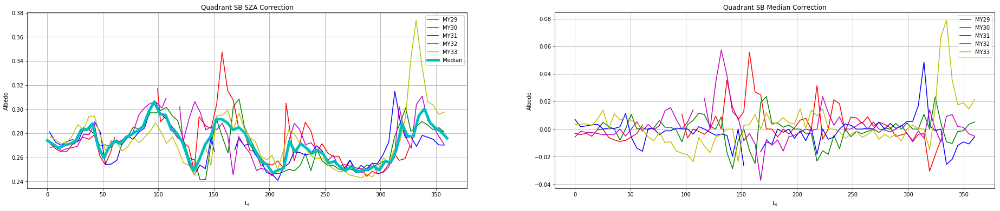

In [127]:
fig, axes = plt.subplots(1,2, sharex = True, sharey = False, figsize= (32,6))
plt.sca(axes[0])
plt.plot(CloudyStatsM29SB[2],CloudyAlbSouthBPrime[0], color ='r', label = 'MY29')
plt.plot(CloudyStatsM30SB[2],CloudyAlbSouthBPrime[1], color ='g', label = 'MY30')
plt.plot(CloudyStatsM31SB[2],CloudyAlbSouthBPrime[2], color ='b', label = 'MY31')
plt.plot(CloudyStatsM32SB[2],CloudyAlbSouthBPrime[3], color ='m', label = 'MY32')
plt.plot(CloudyStatsM33SB[2],CloudyAlbSouthBPrime[4], color ='y', label = 'MY33')
plt.plot(LS, SBmedian , color ='c', linewidth =5.0, label='Median')
plt.xlabel('$\mathregular{L_s}$')
plt.ylabel('Albedo')
plt.title('Quadrant SB SZA Correction')
plt.legend()
plt.grid()
plt.sca(axes[1])
plt.plot(LS,CloudyAlbSouthBMY29MED, color ='r',   label = 'MY29')
plt.plot(LS,CloudyAlbSouthBMY30MED, color ='g',   label = 'MY30')
plt.plot(LS,CloudyAlbSouthBMY31MED, color ='b',   label = 'MY31')
plt.plot(LS,CloudyAlbSouthBMY32MED, color ='m',   label = 'MY32')
plt.plot(LS,CloudyAlbSouthBMY33MED, color ='y',   label = 'MY33')
plt.xlabel('$\mathregular{L_s}$')
plt.ylabel('Albedo')
plt.title('Quadrant SB Median Correction')
plt.legend()
plt.grid()
plt.show()

In [128]:
NCQUAD = np.vstack((CloudyAlbNorthCPrime[0], CloudyAlbNorthCPrime[1],CloudyAlbNorthCPrime[2],
                   CloudyAlbNorthCPrime[3], CloudyAlbNorthCPrime[4]))
NCmedian = [np.nanmedian(NCQUAD[:,0]),np.nanmedian(NCQUAD[:,1]),np.nanmedian(NCQUAD[:,2]),
            np.nanmedian(NCQUAD[:,3]), np.nanmedian(NCQUAD[:,4]),
            np.nanmedian(NCQUAD[:,5]),np.nanmedian(NCQUAD[:,6]),np.nanmedian(NCQUAD[:,7]),np.nanmedian(NCQUAD[:,8]),
            np.nanmedian(NCQUAD[:,9]),np.nanmedian(NCQUAD[:,10]),np.nanmedian(NCQUAD[:,11]),np.nanmedian(NCQUAD[:,12]),
            np.nanmedian(NCQUAD[:,13]),np.nanmedian(NCQUAD[:,14]),np.nanmedian(NCQUAD[:,15]),np.nanmedian(NCQUAD[:,16]),
            np.nanmedian(NCQUAD[:,17]),np.nanmedian(NCQUAD[:,18]),np.nanmedian(NCQUAD[:,19]),np.nanmedian(NCQUAD[:,20]),
            np.nanmedian(NCQUAD[:,21]),np.nanmedian(NCQUAD[:,22]),np.nanmedian(NCQUAD[:,23]),np.nanmedian(NCQUAD[:,24]),
            np.nanmedian(NCQUAD[:,25]),np.nanmedian(NCQUAD[:,26]),np.nanmedian(NCQUAD[:,27]),np.nanmedian(NCQUAD[:,28]),
            np.nanmedian(NCQUAD[:,29]),np.nanmedian(NCQUAD[:,30]),np.nanmedian(NCQUAD[:,31]),np.nanmedian(NCQUAD[:,32]),
            np.nanmedian(NCQUAD[:,33]),np.nanmedian(NCQUAD[:,34]),np.nanmedian(NCQUAD[:,35]),np.nanmedian(NCQUAD[:,36]),
            np.nanmedian(NCQUAD[:,37]),np.nanmedian(NCQUAD[:,38]),np.nanmedian(NCQUAD[:,39]),np.nanmedian(NCQUAD[:,40]),
            np.nanmedian(NCQUAD[:,41]),np.nanmedian(NCQUAD[:,42]),np.nanmedian(NCQUAD[:,43]),np.nanmedian(NCQUAD[:,44]),
            np.nanmedian(NCQUAD[:,45]),np.nanmedian(NCQUAD[:,46]),np.nanmedian(NCQUAD[:,47]),np.nanmedian(NCQUAD[:,48]),
            np.nanmedian(NCQUAD[:,49]),np.nanmedian(NCQUAD[:,50]),np.nanmedian(NCQUAD[:,51]),np.nanmedian(NCQUAD[:,52]),
            np.nanmedian(NCQUAD[:,53]),np.nanmedian(NCQUAD[:,54]),np.nanmedian(NCQUAD[:,55]),np.nanmedian(NCQUAD[:,56]),
            np.nanmedian(NCQUAD[:,57]),np.nanmedian(NCQUAD[:,58]),np.nanmedian(NCQUAD[:,59]),np.nanmedian(NCQUAD[:,60]),
            np.nanmedian(NCQUAD[:,61]),np.nanmedian(NCQUAD[:,62]),np.nanmedian(NCQUAD[:,63]),np.nanmedian(NCQUAD[:,64]),
            np.nanmedian(NCQUAD[:,65]),np.nanmedian(NCQUAD[:,66]),np.nanmedian(NCQUAD[:,67]),np.nanmedian(NCQUAD[:,68]),
            np.nanmedian(NCQUAD[:,69]),np.nanmedian(NCQUAD[:,70]),np.nanmedian(NCQUAD[:,71])]
NCmedian = np.array(NCmedian)

In [129]:
CloudyAlbNorthCMY29MED = CloudyAlbNorthCPrime[0] - NCmedian
CloudyAlbNorthCMY30MED = CloudyAlbNorthCPrime[1] - NCmedian
CloudyAlbNorthCMY31MED = CloudyAlbNorthCPrime[2] - NCmedian
CloudyAlbNorthCMY32MED = CloudyAlbNorthCPrime[3] - NCmedian
CloudyAlbNorthCMY33MED = CloudyAlbNorthCPrime[4] - NCmedian

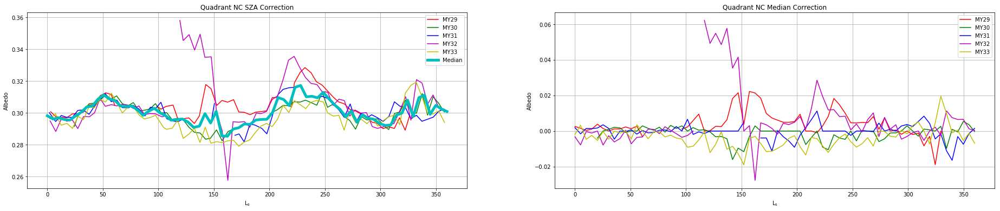

In [130]:
fig, axes = plt.subplots(1,2, sharex = True, sharey = False, figsize= (32,6))
plt.sca(axes[0])
plt.plot(CloudyStatsM29NC[2],CloudyAlbNorthCPrime[0], color ='r',   label = 'MY29')
plt.plot(CloudyStatsM30NC[2],CloudyAlbNorthCPrime[1], color ='g',   label = 'MY30')
plt.plot(CloudyStatsM31NC[2],CloudyAlbNorthCPrime[2], color ='b',   label = 'MY31')
plt.plot(CloudyStatsM32NC[2],CloudyAlbNorthCPrime[3], color ='m',   label = 'MY32')
plt.plot(CloudyStatsM33NC[2],CloudyAlbNorthCPrime[4], color ='y',   label = 'MY33')
plt.plot(LS, NCmedian , color ='c', linewidth =5.0, label='Median')
plt.xlabel('$\mathregular{L_s}$')
plt.ylabel('Albedo')
plt.title('Quadrant NC SZA Correction')
plt.legend()
plt.grid()
plt.sca(axes[1])
plt.plot(LS,CloudyAlbNorthCMY29MED, color ='r',   label = 'MY29')
plt.plot(LS,CloudyAlbNorthCMY30MED, color ='g',   label = 'MY30')
plt.plot(LS,CloudyAlbNorthCMY31MED, color ='b',   label = 'MY31')
plt.plot(LS,CloudyAlbNorthCMY32MED, color ='m',   label = 'MY32')
plt.plot(LS,CloudyAlbNorthCMY33MED, color ='y',   label = 'MY33')
plt.xlabel('$\mathregular{L_s}$')
plt.ylabel('Albedo')
plt.title('Quadrant NC Median Correction')
plt.legend()
plt.grid()
plt.show()

In [131]:
SCQUAD = np.vstack((CloudyAlbSouthCPrime[0], CloudyAlbSouthCPrime[1],CloudyAlbSouthCPrime[2],
                   CloudyAlbSouthCPrime[3], CloudyAlbSouthCPrime[4]))
SCmedian = [np.nanmedian(SCQUAD[:,0]), np.nanmedian(SCQUAD[:,1]), np.nanmedian(SCQUAD[:,2]),
             np.nanmedian(SCQUAD[:,3]), np.nanmedian(SCQUAD[:,4]),
             np.nanmedian(SCQUAD[:,5]), np.nanmedian(SCQUAD[:,6]), np.nanmedian(SCQUAD[:,7]), np.nanmedian(SCQUAD[:,8]),
             np.nanmedian(SCQUAD[:,9]), np.nanmedian(SCQUAD[:,10]),np.nanmedian(SCQUAD[:,11]),np.nanmedian(SCQUAD[:,12]),
             np.nanmedian(SCQUAD[:,13]),np.nanmedian(SCQUAD[:,14]),np.nanmedian(SCQUAD[:,15]),np.nanmedian(SCQUAD[:,16]),
             np.nanmedian(SCQUAD[:,17]),np.nanmedian(SCQUAD[:,18]),np.nanmedian(SCQUAD[:,19]),np.nanmedian(SCQUAD[:,20]),
             np.nanmedian(SCQUAD[:,21]),np.nanmedian(SCQUAD[:,22]),np.nanmedian(SCQUAD[:,23]),np.nanmedian(SCQUAD[:,24]),
             np.nanmedian(SCQUAD[:,25]),np.nanmedian(SCQUAD[:,26]),np.nanmedian(SCQUAD[:,27]),np.nanmedian(SCQUAD[:,28]),
             np.nanmedian(SCQUAD[:,29]),np.nanmedian(SCQUAD[:,30]),np.nanmedian(SCQUAD[:,31]),np.nanmedian(SCQUAD[:,32]),
             np.nanmedian(SCQUAD[:,33]),np.nanmedian(SCQUAD[:,34]),np.nanmedian(SCQUAD[:,35]),np.nanmedian(SCQUAD[:,36]),
             np.nanmedian(SCQUAD[:,37]),np.nanmedian(SCQUAD[:,38]),np.nanmedian(SCQUAD[:,39]),np.nanmedian(SCQUAD[:,40]),
             np.nanmedian(SCQUAD[:,41]),np.nanmedian(SCQUAD[:,42]),np.nanmedian(SCQUAD[:,43]),np.nanmedian(SCQUAD[:,44]),
             np.nanmedian(SCQUAD[:,45]),np.nanmedian(SCQUAD[:,46]),np.nanmedian(SCQUAD[:,47]),np.nanmedian(SCQUAD[:,48]),
             np.nanmedian(SCQUAD[:,49]),np.nanmedian(SCQUAD[:,50]),np.nanmedian(SCQUAD[:,51]),np.nanmedian(SCQUAD[:,52]),
             np.nanmedian(SCQUAD[:,53]),np.nanmedian(SCQUAD[:,54]),np.nanmedian(SCQUAD[:,55]),np.nanmedian(SCQUAD[:,56]),
             np.nanmedian(SCQUAD[:,57]),np.nanmedian(SCQUAD[:,58]),np.nanmedian(SCQUAD[:,59]),np.nanmedian(SCQUAD[:,60]),
             np.nanmedian(SCQUAD[:,61]),np.nanmedian(SCQUAD[:,62]),np.nanmedian(SCQUAD[:,63]),np.nanmedian(SCQUAD[:,64]),
             np.nanmedian(SCQUAD[:,65]),np.nanmedian(SCQUAD[:,66]),np.nanmedian(SCQUAD[:,67]),np.nanmedian(SCQUAD[:,68]),
             np.nanmedian(SCQUAD[:,69]),np.nanmedian(SCQUAD[:,70]),np.nanmedian(SCQUAD[:,71])]
SCmedian = np.array(SCmedian)

In [132]:
CloudyAlbSouthCMY29MED = CloudyAlbSouthCPrime[0] - SCmedian
CloudyAlbSouthCMY30MED = CloudyAlbSouthCPrime[1] - SCmedian
CloudyAlbSouthCMY31MED = CloudyAlbSouthCPrime[2] - SCmedian
CloudyAlbSouthCMY32MED = CloudyAlbSouthCPrime[3] - SCmedian
CloudyAlbSouthCMY33MED = CloudyAlbSouthCPrime[4] - SCmedian

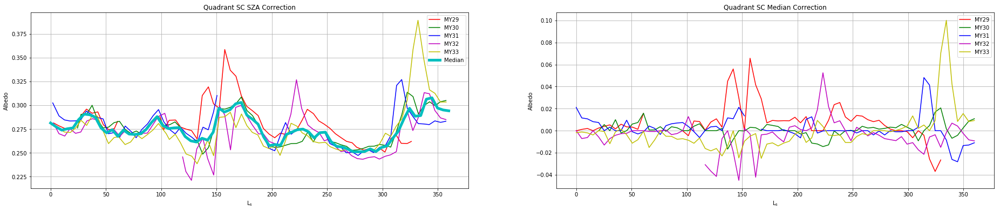

In [133]:
fig, axes = plt.subplots(1,2, sharex = True, sharey = False, figsize= (32,6))
plt.sca(axes[0])
plt.plot(CloudyStatsM29SC[2],CloudyAlbSouthCPrime[0], color ='r', label = 'MY29')
plt.plot(CloudyStatsM30SC[2],CloudyAlbSouthCPrime[1], color ='g', label = 'MY30')
plt.plot(CloudyStatsM31SC[2],CloudyAlbSouthCPrime[2], color ='b', label = 'MY31')
plt.plot(CloudyStatsM32SC[2],CloudyAlbSouthCPrime[3], color ='m', label = 'MY32')
plt.plot(CloudyStatsM33SC[2],CloudyAlbSouthCPrime[4], color ='y', label = 'MY33')
plt.plot(LS, SCmedian , color ='c', linewidth =5.0, label='Median')
plt.xlabel('$\mathregular{L_s}$')
plt.ylabel('Albedo')
plt.title('Quadrant SC SZA Correction')
plt.legend()
plt.grid()
plt.sca(axes[1])
plt.plot(LS,CloudyAlbSouthCMY29MED, color ='r',   label = 'MY29')
plt.plot(LS,CloudyAlbSouthCMY30MED, color ='g',   label = 'MY30')
plt.plot(LS,CloudyAlbSouthCMY31MED, color ='b',   label = 'MY31')
plt.plot(LS,CloudyAlbSouthCMY32MED, color ='m',   label = 'MY32')
plt.plot(LS,CloudyAlbSouthCMY33MED, color ='y',   label = 'MY33')
plt.xlabel('$\mathregular{L_s}$')
plt.ylabel('Albedo')
plt.title('Quadrant SC Median Correction')
plt.legend()
plt.grid()
plt.show()

In [134]:
NDQUAD = np.vstack((CloudyAlbNorthDPrime[0], CloudyAlbNorthDPrime[1],CloudyAlbNorthDPrime[2],
                   CloudyAlbNorthDPrime[3], CloudyAlbNorthDPrime[4]))
NDmedian = [np.nanmedian(NDQUAD[:,0]), np.nanmedian(NDQUAD[:,1]), np.nanmedian(NDQUAD[:,2]),
             np.nanmedian(NDQUAD[:,3]), np.nanmedian(NDQUAD[:,4]),
             np.nanmedian(NDQUAD[:,5]), np.nanmedian(NDQUAD[:,6]), np.nanmedian(NDQUAD[:,7]), np.nanmedian(NDQUAD[:,8]),
             np.nanmedian(NDQUAD[:,9]), np.nanmedian(NDQUAD[:,10]),np.nanmedian(NDQUAD[:,11]),np.nanmedian(NDQUAD[:,12]),
             np.nanmedian(NDQUAD[:,13]),np.nanmedian(NDQUAD[:,14]),np.nanmedian(NDQUAD[:,15]),np.nanmedian(NDQUAD[:,16]),
             np.nanmedian(NDQUAD[:,17]),np.nanmedian(NDQUAD[:,18]),np.nanmedian(NDQUAD[:,19]),np.nanmedian(NDQUAD[:,20]),
             np.nanmedian(NDQUAD[:,21]),np.nanmedian(NDQUAD[:,22]),np.nanmedian(NDQUAD[:,23]),np.nanmedian(NDQUAD[:,24]),
             np.nanmedian(NDQUAD[:,25]),np.nanmedian(NDQUAD[:,26]),np.nanmedian(NDQUAD[:,27]),np.nanmedian(NDQUAD[:,28]),
             np.nanmedian(NDQUAD[:,29]),np.nanmedian(NDQUAD[:,30]),np.nanmedian(NDQUAD[:,31]),np.nanmedian(NDQUAD[:,32]),
             np.nanmedian(NDQUAD[:,33]),np.nanmedian(NDQUAD[:,34]),np.nanmedian(NDQUAD[:,35]),np.nanmedian(NDQUAD[:,36]),
             np.nanmedian(NDQUAD[:,37]),np.nanmedian(NDQUAD[:,38]),np.nanmedian(NDQUAD[:,39]),np.nanmedian(NDQUAD[:,40]),
             np.nanmedian(NDQUAD[:,41]),np.nanmedian(NDQUAD[:,42]),np.nanmedian(NDQUAD[:,43]),np.nanmedian(NDQUAD[:,44]),
             np.nanmedian(NDQUAD[:,45]),np.nanmedian(NDQUAD[:,46]),np.nanmedian(NDQUAD[:,47]),np.nanmedian(NDQUAD[:,48]),
             np.nanmedian(NDQUAD[:,49]),np.nanmedian(NDQUAD[:,50]),np.nanmedian(NDQUAD[:,51]),np.nanmedian(NDQUAD[:,52]),
             np.nanmedian(NDQUAD[:,53]),np.nanmedian(NDQUAD[:,54]),np.nanmedian(NDQUAD[:,55]),np.nanmedian(NDQUAD[:,56]),
             np.nanmedian(NDQUAD[:,57]),np.nanmedian(NDQUAD[:,58]),np.nanmedian(NDQUAD[:,59]),np.nanmedian(NDQUAD[:,60]),
             np.nanmedian(NDQUAD[:,61]),np.nanmedian(NDQUAD[:,62]),np.nanmedian(NDQUAD[:,63]),np.nanmedian(NDQUAD[:,64]),
             np.nanmedian(NDQUAD[:,65]),np.nanmedian(NDQUAD[:,66]),np.nanmedian(NDQUAD[:,67]),np.nanmedian(NDQUAD[:,68]),
             np.nanmedian(NDQUAD[:,69]),np.nanmedian(NDQUAD[:,70]),np.nanmedian(NDQUAD[:,71])]
NDmedian = np.array(NDmedian)

In [135]:
CloudyAlbNorthDMY29MED = CloudyAlbNorthDPrime[0] - NDmedian
CloudyAlbNorthDMY30MED = CloudyAlbNorthDPrime[1] - NDmedian
CloudyAlbNorthDMY31MED = CloudyAlbNorthDPrime[2] - NDmedian
CloudyAlbNorthDMY32MED = CloudyAlbNorthDPrime[3] - NDmedian
CloudyAlbNorthDMY33MED = CloudyAlbNorthDPrime[4] - NDmedian

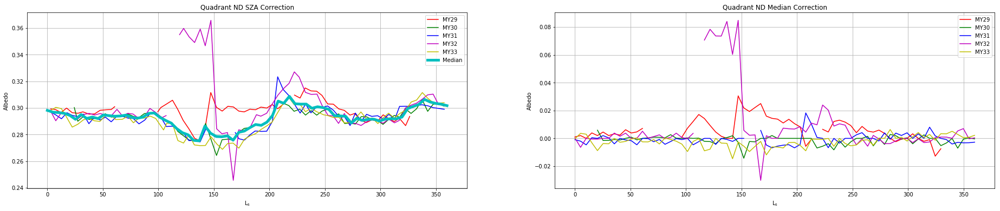

In [136]:
fig, axes = plt.subplots(1,2, sharex = True, sharey = False, figsize= (32,6))
plt.sca(axes[0])
plt.plot(CloudyStatsM29ND[2],CloudyAlbNorthDPrime[0], color ='r',   label = 'MY29')
plt.plot(CloudyStatsM30ND[2],CloudyAlbNorthDPrime[1], color ='g',   label = 'MY30')
plt.plot(CloudyStatsM31ND[2],CloudyAlbNorthDPrime[2], color ='b',   label = 'MY31')
plt.plot(CloudyStatsM32ND[2],CloudyAlbNorthDPrime[3], color ='m',   label = 'MY32')
plt.plot(CloudyStatsM33ND[2],CloudyAlbNorthDPrime[4], color ='y',   label = 'MY33')
plt.plot(LS, NDmedian , color ='c', linewidth =5.0, label='Median')
plt.xlabel('$\mathregular{L_s}$')
plt.ylabel('Albedo')
plt.title('Quadrant ND SZA Correction')
plt.legend()
plt.grid()
plt.sca(axes[1])
plt.plot(LS,CloudyAlbNorthDMY29MED, color ='r',   label = 'MY29')
plt.plot(LS,CloudyAlbNorthDMY30MED, color ='g',   label = 'MY30')
plt.plot(LS,CloudyAlbNorthDMY31MED, color ='b',   label = 'MY31')
plt.plot(LS,CloudyAlbNorthDMY32MED, color ='m',   label = 'MY32')
plt.plot(LS,CloudyAlbNorthDMY33MED, color ='y',   label = 'MY33')
plt.xlabel('$\mathregular{L_s}$')
plt.ylabel('Albedo')
plt.title('Quadrant ND Median Correction')
plt.legend()
plt.grid()
plt.show()

In [137]:
SDQUAD = np.vstack((CloudyAlbSouthDPrime[0], CloudyAlbSouthDPrime[1],CloudyAlbSouthDPrime[2],
                   CloudyAlbSouthDPrime[3], CloudyAlbSouthDPrime[4]))
SDmedian = [np.nanmedian(SDQUAD[:,0]), np.nanmedian(SDQUAD[:,1]), np.nanmedian(SDQUAD[:,2]),
             np.nanmedian(SDQUAD[:,3]), np.nanmedian(SDQUAD[:,4]),
             np.nanmedian(SDQUAD[:,5]), np.nanmedian(SDQUAD[:,6]), np.nanmedian(SDQUAD[:,7]), np.nanmedian(SDQUAD[:,8]),
             np.nanmedian(SDQUAD[:,9]), np.nanmedian(SDQUAD[:,10]),np.nanmedian(SDQUAD[:,11]),np.nanmedian(SDQUAD[:,12]),
             np.nanmedian(SDQUAD[:,13]),np.nanmedian(SDQUAD[:,14]),np.nanmedian(SDQUAD[:,15]),np.nanmedian(SDQUAD[:,16]),
             np.nanmedian(SDQUAD[:,17]),np.nanmedian(SDQUAD[:,18]),np.nanmedian(SDQUAD[:,19]),np.nanmedian(SDQUAD[:,20]),
             np.nanmedian(SDQUAD[:,21]),np.nanmedian(SDQUAD[:,22]),np.nanmedian(SDQUAD[:,23]),np.nanmedian(SDQUAD[:,24]),
             np.nanmedian(SDQUAD[:,25]),np.nanmedian(SDQUAD[:,26]),np.nanmedian(SDQUAD[:,27]),np.nanmedian(SDQUAD[:,28]),
             np.nanmedian(SDQUAD[:,29]),np.nanmedian(SDQUAD[:,30]),np.nanmedian(SDQUAD[:,31]),np.nanmedian(SDQUAD[:,32]),
             np.nanmedian(SDQUAD[:,33]),np.nanmedian(SDQUAD[:,34]),np.nanmedian(SDQUAD[:,35]),np.nanmedian(SDQUAD[:,36]),
             np.nanmedian(SDQUAD[:,37]),np.nanmedian(SDQUAD[:,38]),np.nanmedian(SDQUAD[:,39]),np.nanmedian(SDQUAD[:,40]),
             np.nanmedian(SDQUAD[:,41]),np.nanmedian(SDQUAD[:,42]),np.nanmedian(SDQUAD[:,43]),np.nanmedian(SDQUAD[:,44]),
             np.nanmedian(SDQUAD[:,45]),np.nanmedian(SDQUAD[:,46]),np.nanmedian(SDQUAD[:,47]),np.nanmedian(SDQUAD[:,48]),
             np.nanmedian(SDQUAD[:,49]),np.nanmedian(SDQUAD[:,50]),np.nanmedian(SDQUAD[:,51]),np.nanmedian(SDQUAD[:,52]),
             np.nanmedian(SDQUAD[:,53]),np.nanmedian(SDQUAD[:,54]),np.nanmedian(SDQUAD[:,55]),np.nanmedian(SDQUAD[:,56]),
             np.nanmedian(SDQUAD[:,57]),np.nanmedian(SDQUAD[:,58]),np.nanmedian(SDQUAD[:,59]),np.nanmedian(SDQUAD[:,60]),
             np.nanmedian(SDQUAD[:,61]),np.nanmedian(SDQUAD[:,62]),np.nanmedian(SDQUAD[:,63]),np.nanmedian(SDQUAD[:,64]),
             np.nanmedian(SDQUAD[:,65]),np.nanmedian(SDQUAD[:,66]),np.nanmedian(SDQUAD[:,67]),np.nanmedian(SDQUAD[:,68]),
             np.nanmedian(SDQUAD[:,69]),np.nanmedian(SDQUAD[:,70]),np.nanmedian(SDQUAD[:,71])]
SDmedian = np.array(SDmedian)

In [138]:
CloudyAlbSouthDMY29MED = CloudyAlbSouthDPrime[0] - SDmedian
CloudyAlbSouthDMY30MED = CloudyAlbSouthDPrime[1] - SDmedian
CloudyAlbSouthDMY31MED = CloudyAlbSouthDPrime[2] - SDmedian
CloudyAlbSouthDMY32MED = CloudyAlbSouthDPrime[3] - SDmedian
CloudyAlbSouthDMY33MED = CloudyAlbSouthDPrime[4] - SDmedian

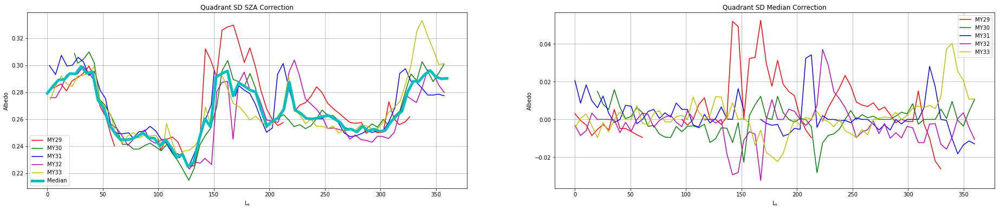

In [139]:
fig, axes = plt.subplots(1,2, sharex = True, sharey = False, figsize= (32,6))
plt.sca(axes[0])
plt.plot(CloudyStatsM29SD[2],CloudyAlbSouthDPrime[0], color ='r', label = 'MY29')
plt.plot(CloudyStatsM30SD[2],CloudyAlbSouthDPrime[1], color ='g', label = 'MY30')
plt.plot(CloudyStatsM31SD[2],CloudyAlbSouthDPrime[2], color ='b', label = 'MY31')
plt.plot(CloudyStatsM32SD[2],CloudyAlbSouthDPrime[3], color ='m', label = 'MY32')
plt.plot(CloudyStatsM33SD[2],CloudyAlbSouthDPrime[4], color ='y', label = 'MY33')
plt.plot(LS, SDmedian , color ='c', linewidth =5.0, label='Median')
plt.xlabel('$\mathregular{L_s}$')
plt.ylabel('Albedo')
plt.title('Quadrant SD SZA Correction')
plt.legend()
plt.grid()
plt.sca(axes[1])
plt.plot(LS,CloudyAlbSouthDMY29MED, color ='r',   label = 'MY29')
plt.plot(LS,CloudyAlbSouthDMY30MED, color ='g',   label = 'MY30')
plt.plot(LS,CloudyAlbSouthDMY31MED, color ='b',   label = 'MY31')
plt.plot(LS,CloudyAlbSouthDMY32MED, color ='m',   label = 'MY32')
plt.plot(LS,CloudyAlbSouthDMY33MED, color ='y',   label = 'MY33')
plt.xlabel('$\mathregular{L_s}$')
plt.ylabel('Albedo')
plt.title('Quadrant SD Median Correction')
plt.legend()
plt.grid()
plt.show()

In [140]:
NEQUAD = np.vstack((CloudyAlbNorthEPrime[0], CloudyAlbNorthEPrime[1],CloudyAlbNorthEPrime[2],
                   CloudyAlbNorthEPrime[3], CloudyAlbNorthEPrime[4]))
NEmedian = [np.nanmedian(NDQUAD[:,0]), np.nanmedian(NEQUAD[:,1]), np.nanmedian(NEQUAD[:,2]),
             np.nanmedian(NEQUAD[:,3]), np.nanmedian(NEQUAD[:,4]),
             np.nanmedian(NEQUAD[:,5]), np.nanmedian(NEQUAD[:,6]), np.nanmedian(NEQUAD[:,7]), np.nanmedian(NEQUAD[:,8]),
             np.nanmedian(NEQUAD[:,9]), np.nanmedian(NEQUAD[:,10]),np.nanmedian(NEQUAD[:,11]),np.nanmedian(NEQUAD[:,12]),
             np.nanmedian(NEQUAD[:,13]),np.nanmedian(NEQUAD[:,14]),np.nanmedian(NEQUAD[:,15]),np.nanmedian(NEQUAD[:,16]),
             np.nanmedian(NEQUAD[:,17]),np.nanmedian(NEQUAD[:,18]),np.nanmedian(NEQUAD[:,19]),np.nanmedian(NEQUAD[:,20]),
             np.nanmedian(NEQUAD[:,21]),np.nanmedian(NEQUAD[:,22]),np.nanmedian(NEQUAD[:,23]),np.nanmedian(NEQUAD[:,24]),
             np.nanmedian(NEQUAD[:,25]),np.nanmedian(NEQUAD[:,26]),np.nanmedian(NEQUAD[:,27]),np.nanmedian(NEQUAD[:,28]),
             np.nanmedian(NEQUAD[:,29]),np.nanmedian(NEQUAD[:,30]),np.nanmedian(NEQUAD[:,31]),np.nanmedian(NEQUAD[:,32]),
             np.nanmedian(NEQUAD[:,33]),np.nanmedian(NEQUAD[:,34]),np.nanmedian(NEQUAD[:,35]),np.nanmedian(NEQUAD[:,36]),
             np.nanmedian(NEQUAD[:,37]),np.nanmedian(NEQUAD[:,38]),np.nanmedian(NEQUAD[:,39]),np.nanmedian(NEQUAD[:,40]),
             np.nanmedian(NEQUAD[:,41]),np.nanmedian(NEQUAD[:,42]),np.nanmedian(NEQUAD[:,43]),np.nanmedian(NEQUAD[:,44]),
             np.nanmedian(NEQUAD[:,45]),np.nanmedian(NEQUAD[:,46]),np.nanmedian(NEQUAD[:,47]),np.nanmedian(NEQUAD[:,48]),
             np.nanmedian(NEQUAD[:,49]),np.nanmedian(NEQUAD[:,50]),np.nanmedian(NEQUAD[:,51]),np.nanmedian(NEQUAD[:,52]),
             np.nanmedian(NEQUAD[:,53]),np.nanmedian(NEQUAD[:,54]),np.nanmedian(NEQUAD[:,55]),np.nanmedian(NEQUAD[:,56]),
             np.nanmedian(NEQUAD[:,57]),np.nanmedian(NEQUAD[:,58]),np.nanmedian(NEQUAD[:,59]),np.nanmedian(NEQUAD[:,60]),
             np.nanmedian(NEQUAD[:,61]),np.nanmedian(NEQUAD[:,62]),np.nanmedian(NEQUAD[:,63]),np.nanmedian(NEQUAD[:,64]),
             np.nanmedian(NEQUAD[:,65]),np.nanmedian(NEQUAD[:,66]),np.nanmedian(NEQUAD[:,67]),np.nanmedian(NEQUAD[:,68]),
             np.nanmedian(NEQUAD[:,69]),np.nanmedian(NEQUAD[:,70]),np.nanmedian(NEQUAD[:,71])]
NEmedian = np.array(NEmedian)

In [141]:
CloudyAlbNorthEMY29MED = CloudyAlbNorthEPrime[0] - NEmedian
CloudyAlbNorthEMY30MED = CloudyAlbNorthEPrime[1] - NEmedian
CloudyAlbNorthEMY31MED = CloudyAlbNorthEPrime[2] - NEmedian
CloudyAlbNorthEMY32MED = CloudyAlbNorthEPrime[3] - NEmedian
CloudyAlbNorthEMY33MED = CloudyAlbNorthEPrime[4] - NEmedian

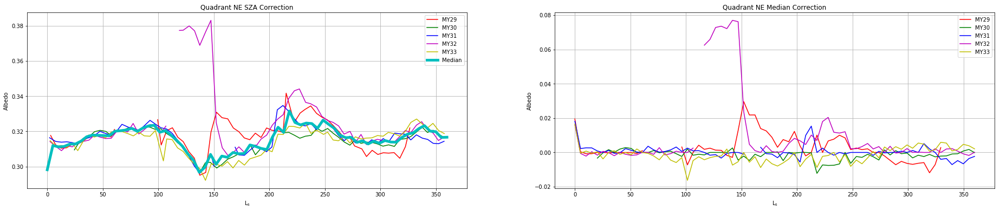

In [142]:
fig, axes = plt.subplots(1,2, sharex = True, sharey = False, figsize= (32,6))
plt.sca(axes[0])
plt.plot(CloudyStatsM29NE[2],CloudyAlbNorthEPrime[0], color ='r',   label = 'MY29')
plt.plot(CloudyStatsM30NE[2],CloudyAlbNorthEPrime[1], color ='g',   label = 'MY30')
plt.plot(CloudyStatsM31NE[2],CloudyAlbNorthEPrime[2], color ='b',   label = 'MY31')
plt.plot(CloudyStatsM32NE[2],CloudyAlbNorthEPrime[3], color ='m',   label = 'MY32')
plt.plot(CloudyStatsM33NE[2],CloudyAlbNorthEPrime[4], color ='y',   label = 'MY33')
plt.plot(LS, NEmedian , color ='c', linewidth =5.0, label='Median')
plt.xlabel('$\mathregular{L_s}$')
plt.ylabel('Albedo')
plt.title('Quadrant NE SZA Correction')
plt.legend()
plt.grid()
plt.sca(axes[1])
plt.plot(LS,CloudyAlbNorthEMY29MED, color ='r',   label = 'MY29')
plt.plot(LS,CloudyAlbNorthEMY30MED, color ='g',   label = 'MY30')
plt.plot(LS,CloudyAlbNorthEMY31MED, color ='b',   label = 'MY31')
plt.plot(LS,CloudyAlbNorthEMY32MED, color ='m',   label = 'MY32')
plt.plot(LS,CloudyAlbNorthEMY33MED, color ='y',   label = 'MY33')
plt.xlabel('$\mathregular{L_s}$')
plt.ylabel('Albedo')
plt.title('Quadrant NE Median Correction')
plt.legend()
plt.grid()
plt.show()

In [143]:
SEQUAD = np.vstack((CloudyAlbSouthEPrime[0], CloudyAlbSouthEPrime[1],CloudyAlbSouthEPrime[2],
                   CloudyAlbSouthEPrime[3], CloudyAlbSouthEPrime[4]))
SEmedian = [np.nanmedian(SEQUAD[:,0]), np.nanmedian(SEQUAD[:,1]), np.nanmedian(SEQUAD[:,2]),
             np.nanmedian(SEQUAD[:,3]), np.nanmedian(SEQUAD[:,4]),
             np.nanmedian(SEQUAD[:,5]), np.nanmedian(SEQUAD[:,6]), np.nanmedian(SEQUAD[:,7]), np.nanmedian(SEQUAD[:,8]),
             np.nanmedian(SEQUAD[:,9]), np.nanmedian(SEQUAD[:,10]),np.nanmedian(SEQUAD[:,11]),np.nanmedian(SEQUAD[:,12]),
             np.nanmedian(SEQUAD[:,13]),np.nanmedian(SEQUAD[:,14]),np.nanmedian(SEQUAD[:,15]),np.nanmedian(SEQUAD[:,16]),
             np.nanmedian(SEQUAD[:,17]),np.nanmedian(SEQUAD[:,18]),np.nanmedian(SEQUAD[:,19]),np.nanmedian(SEQUAD[:,20]),
             np.nanmedian(SEQUAD[:,21]),np.nanmedian(SEQUAD[:,22]),np.nanmedian(SEQUAD[:,23]),np.nanmedian(SEQUAD[:,24]),
             np.nanmedian(SEQUAD[:,25]),np.nanmedian(SEQUAD[:,26]),np.nanmedian(SEQUAD[:,27]),np.nanmedian(SEQUAD[:,28]),
             np.nanmedian(SEQUAD[:,29]),np.nanmedian(SEQUAD[:,30]),np.nanmedian(SEQUAD[:,31]),np.nanmedian(SEQUAD[:,32]),
             np.nanmedian(SEQUAD[:,33]),np.nanmedian(SEQUAD[:,34]),np.nanmedian(SEQUAD[:,35]),np.nanmedian(SEQUAD[:,36]),
             np.nanmedian(SEQUAD[:,37]),np.nanmedian(SEQUAD[:,38]),np.nanmedian(SEQUAD[:,39]),np.nanmedian(SEQUAD[:,40]),
             np.nanmedian(SEQUAD[:,41]),np.nanmedian(SEQUAD[:,42]),np.nanmedian(SEQUAD[:,43]),np.nanmedian(SEQUAD[:,44]),
             np.nanmedian(SEQUAD[:,45]),np.nanmedian(SEQUAD[:,46]),np.nanmedian(SEQUAD[:,47]),np.nanmedian(SEQUAD[:,48]),
             np.nanmedian(SEQUAD[:,49]),np.nanmedian(SEQUAD[:,50]),np.nanmedian(SEQUAD[:,51]),np.nanmedian(SEQUAD[:,52]),
             np.nanmedian(SEQUAD[:,53]),np.nanmedian(SEQUAD[:,54]),np.nanmedian(SEQUAD[:,55]),np.nanmedian(SEQUAD[:,56]),
             np.nanmedian(SEQUAD[:,57]),np.nanmedian(SEQUAD[:,58]),np.nanmedian(SEQUAD[:,59]),np.nanmedian(SEQUAD[:,60]),
             np.nanmedian(SEQUAD[:,61]),np.nanmedian(SEQUAD[:,62]),np.nanmedian(SEQUAD[:,63]),np.nanmedian(SEQUAD[:,64]),
             np.nanmedian(SEQUAD[:,65]),np.nanmedian(SEQUAD[:,66]),np.nanmedian(SEQUAD[:,67]),np.nanmedian(SEQUAD[:,68]),
             np.nanmedian(SEQUAD[:,69]),np.nanmedian(SEQUAD[:,70]),np.nanmedian(SEQUAD[:,71])]
SEmedian = np.array(SEmedian)

In [144]:
CloudyAlbSouthEMY29MED = CloudyAlbSouthEPrime[0] - SEmedian
CloudyAlbSouthEMY30MED = CloudyAlbSouthEPrime[1] - SEmedian
CloudyAlbSouthEMY31MED = CloudyAlbSouthEPrime[2] - SEmedian
CloudyAlbSouthEMY32MED = CloudyAlbSouthEPrime[3] - SEmedian
CloudyAlbSouthEMY33MED = CloudyAlbSouthEPrime[4] - SEmedian

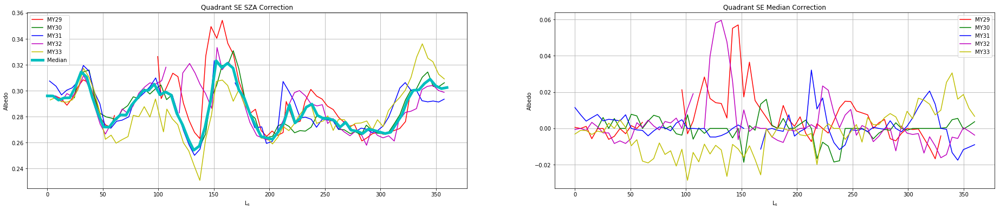

In [145]:
fig, axes = plt.subplots(1,2, sharex = True, sharey = False, figsize= (32,6))
plt.sca(axes[0])
plt.plot(CloudyStatsM29SE[2],CloudyAlbSouthEPrime[0], color ='r', label = 'MY29')
plt.plot(CloudyStatsM30SE[2],CloudyAlbSouthEPrime[1], color ='g', label = 'MY30')
plt.plot(CloudyStatsM31SE[2],CloudyAlbSouthEPrime[2], color ='b', label = 'MY31')
plt.plot(CloudyStatsM32SE[2],CloudyAlbSouthEPrime[3], color ='m', label = 'MY32')
plt.plot(CloudyStatsM33SE[2],CloudyAlbSouthEPrime[4], color ='y', label = 'MY33')
plt.plot(LS, SEmedian , color ='c', linewidth =5.0, label='Median')
plt.xlabel('$\mathregular{L_s}$')
plt.ylabel('Albedo')
plt.title('Quadrant SE SZA Correction')
plt.legend()
plt.grid()
plt.sca(axes[1])
plt.plot(LS,CloudyAlbSouthEMY29MED, color ='r',   label = 'MY29')
plt.plot(LS,CloudyAlbSouthEMY30MED, color ='g',   label = 'MY30')
plt.plot(LS,CloudyAlbSouthEMY31MED, color ='b',   label = 'MY31')
plt.plot(LS,CloudyAlbSouthEMY32MED, color ='m',   label = 'MY32')
plt.plot(LS,CloudyAlbSouthEMY33MED, color ='y',   label = 'MY33')
plt.xlabel('$\mathregular{L_s}$')
plt.ylabel('Albedo')
plt.title('Quadrant SE Median Correction')
plt.legend()
plt.grid()
plt.show()